In [ ]:
# Install required packages
!pip install catboost
!pip install seaborn
!pip install gym
!pip install stable-baselines3
!pip install pybullet
!pip install gymnasium
!pip install tensorflow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.5/184.5 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 37.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 44.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu1

In [ ]:
import tensorflow as tf
from google.colab import drive
drive.mount('/content/drive')
data_path = '/content/drive/MyDrive/EVD/data/'

Mounted at /content/drive


In [ ]:
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

from tensorflow.python.client import device_lib
device_lib.list_local_devices()

Found GPU at: /device:GPU:0


[name: "/device:CPU:0"
 device_type: "CPU"
 memory_limit: 268435456
 locality {
 }
 incarnation: 8594476156385100996
 xla_global_id: -1,
 name: "/device:GPU:0"
 device_type: "GPU"
 memory_limit: 14619377664
 locality {
   bus_id: 1
   links {
   }
 }
 incarnation: 5272562818201640399
 physical_device_desc: "device: 0, name: Tesla T4, pci bus id: 0000:00:04.0, compute capability: 7.5"
 xla_global_id: 416903419]

In [ ]:
import time
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from catboost import CatBoostRegressor, Pool
import matplotlib.pyplot as plt
import pickle
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.optim as optim
from collections import deque
import random
from sklearn.mixture import GaussianMixture
import gymnasium as gym
from gymnasium import spaces
from stable_baselines3 import SAC
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.callbacks import BaseCallback

# Load the dataset
df = pd.read_csv(data_path + "helsinki_ev_data_price.csv")

# Shuffle the dataset
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)

# Select the first 30,000 samples
df_subset = df_shuffled.head(30000)

# Define features and target
features_to_drop = ['Day','Time (HH:MM:SS)', 'Charging_Event (Count)', 'Charging_Demand (kWh)']
X = df_subset.drop(features_to_drop, axis=1)
y = df_subset['Charging_Demand (kWh)'].astype(float)  # Explicitly convert to float

# Identify categorical features
categorical_features = ['Region_ID']
numerical_features = [col for col in X.columns if col not in categorical_features]

# Normalize numerical features
scaler = MinMaxScaler()
X[numerical_features] = scaler.fit_transform(X[numerical_features])

# Convert categorical features to string
X[categorical_features] = X[categorical_features].astype(str)

# Initialize k-fold cross-validation
k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)

# Enhanced EVChargingEnv class
class EnhancedEVChargingEnv(gym.Env):
    def __init__(self, catboost_model, X_data, y_data):
        super(EnhancedEVChargingEnv, self).__init__()

        self.catboost_model = catboost_model
        self.X_data = X_data.values
        self.y_data = y_data.values
        self.current_idx = 0

        # Enhanced price parameters
        self.P_base = 0.25   # EUR/kWh
        self.P_min = 0.20
        self.P_max = 0.40
        self.alpha = 0.15

        # Initialize current_price
        self.current_price = self.P_base

        # Smoothing buffers
        self.price_memory = deque(maxlen=5)  # For action smoothing
        self.demand_memory = deque(maxlen=3) # For demand smoothing

        # Enhanced constraints
        self.max_daily_price_change = 0.10  # Max 10% daily variation
        self.target_load = np.mean(y_data)
        self.L_th = self.target_load * 1.5

        # Observation/action spaces
        self.observation_space = spaces.Box(
            low=np.array([0, 0, 0, 0, 0, 0, self.P_min]),
            high=np.array([np.inf, np.inf, 100, np.inf, np.inf, np.inf, self.P_max]),
            dtype=np.float32
        )
        self.action_space = spaces.Box(low=-1.0, high=1.0, shape=(1,), dtype=np.float32)

        # Enhanced driver behavior model
        self.n_clusters = 3
        self.gmm = GaussianMixture(n_components=self.n_clusters)
        demands = self.y_data.reshape(-1, 1)
        self.gmm.fit(demands)
        self.gamma_k = np.array([0.8, 0.5, 0.3])  # Price sensitivity coefficients

        # Add demand tracking
        self.demand_history = []
        self.deviation_history = []
        self.target_load = np.mean(y_data)  # Ensure this is defined

    def _fit_driver_model(self):
        """Fit Gaussian Mixture Model to historical demand data"""
        demands = self.y_data.reshape(-1, 1)
        self.gmm.fit(demands)

    def _get_driver_response(self, price_change):
        """Simulate driver response to price change using GMM"""
        L_base, cluster = self.gmm.sample()
        L_base = max(0, L_base[0, 0])  # Ensure non-negative base demand
        gamma = self.gamma_k[cluster[0]]
        L_t = L_base * (1 - gamma * price_change)
        return max(0, L_t)  # Ensure non-negative demand

    def _get_state(self, features):
        """Create state vector using only available features"""
        features_df = pd.DataFrame([features], columns=X.columns)
        features_df[categorical_features] = features_df[categorical_features].astype(str)
        pool = Pool(features_df, cat_features=categorical_features)
        predicted_demand = max(0, self.catboost_model.predict(pool)[0])  # Ensure non-negative
        return np.array([
            predicted_demand, 1.0, 50.0, 20.0, 12.0, 1.0, self.current_price
        ], dtype=np.float32)

    def _enhanced_reward(self, current_demand, previous_demand, price_change, deviation):
        """New reward with demand growth penalty"""
        demand_growth_penalty = -0.5 * max(0, current_demand - previous_demand)
        reward = (
            -0.7 * (deviation ** 2) +
            -0.3 * (price_change ** 2) +
            -1.5 * max(0, current_demand - self.target_load) +
            demand_growth_penalty  # Penalize demand increases
        )
        if abs(price_change) > self.max_daily_price_change:
            reward -= 0.5 * (abs(price_change) - self.max_daily_price_change) ** 2
        return reward

    def step(self, action):
        # Action smoothing
        self.price_memory.append(action[0])
        smoothed_action = np.mean(self.price_memory)

        # Price adjustment
        price_adjustment = smoothed_action * 1.5
        new_price = self.P_base + self.alpha * price_adjustment
        new_price = np.clip(new_price, self.P_min, self.P_max)
        price_change = (new_price - self.current_price)/self.current_price

        # Get driver response
        price_change_pct = (new_price - self.P_base)/self.P_base
        actual_demand = self._get_driver_response(price_change_pct)
        self.demand_memory.append(actual_demand)

        # Calculate reward
        deviation = actual_demand - self.target_load
        reward = self._enhanced_reward(
            actual_demand,
            self.demand_memory[-2] if len(self.demand_memory) > 1 else actual_demand,
            price_change,
            deviation
        )

        # Store demand and deviation
        self.demand_history.append(actual_demand)
        self.deviation_history.append(deviation)

        # Update state
        self.current_idx = (self.current_idx + 1) % len(self.X_data)
        next_state = self._get_state(self.X_data[self.current_idx])
        next_state[-1] = new_price
        self.current_state = next_state
        self.current_price = new_price

        return next_state, reward, False, False, {
            'price': new_price,
            'demand': actual_demand,
            'deviation': deviation,
            'target_demand': self.target_load
        }

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.current_idx = 0
        self.current_state = self._get_state(self.X_data[self.current_idx])
        self.current_price = self.P_base
        return self.current_state, {}

# Enhanced CatBoost parameters
params = {
    'iterations': 1200,
    'learning_rate': 0.025,
    'depth': 7,
    'l2_leaf_reg': 3,
    'loss_function': 'RMSE',
    'eval_metric': 'RMSE',
    'random_seed': 42,
    'od_type': 'Iter',
    'od_wait': 100,
    'verbose': 100,
    'task_type': 'GPU' if device_name else 'CPU',
    'border_count': 128
}

# Initialize results storage
catboost_rl_results = {
    'train_loss': [], 'val_loss': [], 'train_r2': [], 'val_r2': [],
    'train_mae': [], 'val_mae': [], 'train_rmse': [], 'val_rmse': [],
    'test_metrics': [], 'test_predictions': [], 'feature_importances': [],
    'training_times': [], 'best_iterations': [], 'rl_rewards': [],
    'rl_prices': [], 'rl_demands': [], 'sac_losses': []
}

# K-fold cross-validation loop with RL integration
for fold, (train_idx, test_idx) in enumerate(kf.split(X)):
    print(f"\n=== Fold {fold + 1}/{k_folds} ===")

    # Split data
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Further split into train/val
    val_size = 0.15
    split_idx = int(len(X_train) * (1 - val_size))
    X_train_fold, X_val_fold = X_train[:split_idx], X_train[split_idx:]
    y_train_fold, y_val_fold = y_train[:split_idx], y_train[split_idx:]

    # Create CatBoost Pool objects
    train_pool = Pool(X_train_fold, y_train_fold, cat_features=categorical_features)
    val_pool = Pool(X_val_fold, y_val_fold, cat_features=categorical_features)
    test_pool = Pool(X_test, y_test, cat_features=categorical_features)

    # Time the training
    start_time = time.time()

    # Initialize and train CatBoost model
    model = CatBoostRegressor(**params)
    model.fit(
        train_pool,
        eval_set=val_pool,
        use_best_model=True,
        plot=False
    )

    end_time = time.time()
    fold_time = end_time - start_time
    catboost_rl_results['training_times'].append(fold_time)
    catboost_rl_results['best_iterations'].append(model.best_iteration_)

    print(f"Training time for fold {fold + 1}: {fold_time:.2f} seconds")
    print(f"Best iteration: {model.best_iteration_}")

    # Get training history
    history = model.get_evals_result()
    catboost_rl_results['train_loss'].append(history['learn']['RMSE'])
    catboost_rl_results['val_loss'].append(history['validation']['RMSE'])

    # Calculate metrics
    def calculate_metrics(pool, y_true):
        y_pred = model.predict(pool)
        return {
            'r2': r2_score(y_true, y_pred),
            'mae': mean_absolute_error(y_true, y_pred),
            'rmse': np.sqrt(mean_squared_error(y_true, y_pred))
        }

    # Training metrics
    train_metrics = calculate_metrics(train_pool, y_train_fold)
    catboost_rl_results['train_r2'].append([train_metrics['r2']] * len(history['learn']['RMSE']))
    catboost_rl_results['train_mae'].append([train_metrics['mae']] * len(history['learn']['RMSE']))
    catboost_rl_results['train_rmse'].append([train_metrics['rmse']] * len(history['learn']['RMSE']))

    # Validation metrics
    val_metrics = calculate_metrics(val_pool, y_val_fold)
    catboost_rl_results['val_r2'].append([val_metrics['r2']] * len(history['validation']['RMSE']))
    catboost_rl_results['val_mae'].append([val_metrics['mae']] * len(history['validation']['RMSE']))
    catboost_rl_results['val_rmse'].append([val_metrics['rmse']] * len(history['validation']['RMSE']))

    # Test evaluation
    test_pred = model.predict(test_pool)
    catboost_rl_results['test_predictions'].append(test_pred)

    test_metrics = {
        'mae': mean_absolute_error(y_test, test_pred),
        'rmse': np.sqrt(mean_squared_error(y_test, test_pred)),
        'r2': r2_score(y_test, test_pred)
    }
    catboost_rl_results['test_metrics'].append(test_metrics)

    # Feature importance
    catboost_rl_results['feature_importances'].append(model.get_feature_importance())

    print(f"\nFold {fold + 1} Test Metrics:")
    print(f"MAE: {test_metrics['mae']:.4f}, RMSE: {test_metrics['rmse']:.4f}, R²: {test_metrics['r2']:.4f}")

    # Initialize RL environment with CatBoost model
    env = EnhancedEVChargingEnv(model, X_val_fold, y_val_fold)

    # Custom callback to track rewards and prices
    class CustomCallback(BaseCallback):
        def __init__(self, verbose=0):
            super(CustomCallback, self).__init__(verbose)
            self.rewards = []
            self.prices = []
            self.demands = []

        def _on_step(self) -> bool:
            info = self.locals['infos'][0]
            self.rewards.append(self.locals['rewards'][0])
            self.prices.append(info['price'])
            self.demands.append(info['demand'])
            return True

    callback = CustomCallback()

    # Train the SAC agent
    sac_agent = SAC(
        'MlpPolicy',
        env,
        verbose=1,
        device='cuda' if torch.cuda.is_available() else 'cpu',
        learning_rate=3e-4,
        buffer_size=300000,
        batch_size=1024,
        ent_coef='auto',
        gamma=0.99,
        tau=0.005,
        policy_kwargs=dict(net_arch=[256, 256])
    )

    sac_agent.learn(total_timesteps=50000, callback=callback)

    # Store RL results
    catboost_rl_results['rl_rewards'].append(callback.rewards)
    catboost_rl_results['rl_prices'].append(callback.prices)
    catboost_rl_results['rl_demands'].append(callback.demands)

    print(f"\nRL Training completed for fold {fold + 1}")
    print(f"Average Reward: {np.mean(callback.rewards):.2f}")
    print(f"Price Range: {np.min(callback.prices):.3f}-{np.max(callback.prices):.3f} EUR/kWh")
    print(f"Average Demand: {np.mean(callback.demands):.2f} kWh")

# Calculate and display final results
avg_test_mae = np.mean([res['mae'] for res in catboost_rl_results['test_metrics']])
avg_test_rmse = np.mean([res['rmse'] for res in catboost_rl_results['test_metrics']])
avg_test_r2 = np.mean([res['r2'] for res in catboost_rl_results['test_metrics']])
avg_training_time = np.mean(catboost_rl_results['training_times'])
avg_iterations = np.mean(catboost_rl_results['best_iterations'])

# Calculate RL metrics
all_prices = np.concatenate(catboost_rl_results['rl_prices'])
all_demands = np.concatenate(catboost_rl_results['rl_demands'])
price_elasticity = np.corrcoef(all_prices, all_demands)[0, 1]

print("\n=== Final CatBoost with RL Cross-Validation Results ===")
print(f"Average Test MAE across {k_folds} folds: {avg_test_mae:.4f}")
print(f"Average Test RMSE across {k_folds} folds: {avg_test_rmse:.4f}")
print(f"Average Test R² across {k_folds} folds: {avg_test_r2:.4f}")
print(f"\nAverage CatBoost training time: {avg_training_time:.2f} seconds")
print(f"Average best iterations: {avg_iterations:.1f}")
print(f"\nRL Performance Summary:")
print(f"Average Price: {np.mean(all_prices):.3f} ± {np.std(all_prices):.3f} EUR/kWh")
print(f"Price Elasticity: {price_elasticity:.3f}")
print(f"Average Demand: {np.mean(all_demands):.2f} kWh")

def plot_demand_smoothing_comparison(original_demand, rl_demands, target_load, sample_size=1000):
    """
    Enhanced plot comparing original vs. RL-smoothed demand with:
    - Volatility reduction metrics
    - Peak demand analysis
    - Target zone visualization
    - Critical peak highlighting
    """
    # Sample data for cleaner visualization
    sample_idx = np.linspace(0, len(rl_demands)-1, min(sample_size, len(rl_demands))).astype(int)
    sampled_original = original_demand[sample_idx]
    sampled_rl = np.array(rl_demands)[sample_idx]

    # Create figure
    plt.figure(figsize=(16, 7))

    # Plot both demand curves
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.6,
             label='Original Demand (No Price Adjustments)', linewidth=1)
    plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.9,
             label='RL-Optimized Demand', linewidth=1.5)

    # Target zone visualization
    plt.axhline(y=target_load, color='k', linestyle='--', label='Target Demand')
    plt.fill_between(
        sample_idx,
        target_load * 0.9,
        target_load * 1.1,
        color='green',
        alpha=0.08,
        label='±10% Target Zone'
    )

    # Calculate key metrics
    original_std = np.std(sampled_original)
    rl_std = np.std(sampled_rl)
    smoothing_percentage = 100 * (original_std - rl_std) / original_std

    peak_reduction = 100 * (1 - np.max(sampled_rl)/np.max(sampled_original))
    avg_demand_reduction = 100 * (1 - np.mean(sampled_rl)/np.mean(sampled_original))

    # Annotate metrics
    metric_text = (
        f'Smoothing Effect: {smoothing_percentage:.1f}% volatility reduction\n'
        f'Peak Reduction: {peak_reduction:.1f}% (Max: {np.max(sampled_original):.2f} → {np.max(sampled_rl):.2f})\n'
        f'Avg Demand Change: {avg_demand_reduction:+.1f}%\n'
        f'Original STD: {original_std:.3f} → RL STD: {rl_std:.3f}'
    )

    plt.text(
        0.02, 0.95,
        metric_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=10,
        verticalalignment='top'
    )

    # Formatting
    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel('Demand (kWh)', fontsize=12)
    plt.title('Demand Smoothing via RL Price Optimization\n'
             f'Target Load: {target_load:.2f} kWh', fontsize=14)

    plt.legend(loc='upper right', framealpha=0.9)
    plt.grid(alpha=0.2)
    plt.ylim(0, max(np.max(sampled_original)*1.1, target_load*1.5))

    plt.tight_layout()
    plt.show()

# Generate the enhanced plot
last_fold_idx = k_folds - 1
rl_demands = catboost_rl_results['rl_demands'][last_fold_idx]
original_demand = y.values  # Your original demand data

plot_demand_smoothing_comparison(
    original_demand=original_demand,
    rl_demands=rl_demands,
    target_load=env.target_load
)

# Save results
def save_catboost_rl_results():
    results = {
        'avg_test_metrics': {
            'mae': avg_test_mae,
            'rmse': avg_test_rmse,
            'r2': avg_test_r2
        },
        'timing': {
            'per_fold_times': catboost_rl_results['training_times'],
            'average_time': avg_training_time,
            'per_fold_iterations': catboost_rl_results['best_iterations'],
            'average_iterations': avg_iterations
        },
        'test_results': {
            'y_true': np.concatenate([y.iloc[test_idx] for _, test_idx in kf.split(X)]),
            'y_pred': np.concatenate(catboost_rl_results['test_predictions']),
            'metrics': catboost_rl_results['test_metrics']
        },
        'rl_results': {
            'rewards': catboost_rl_results['rl_rewards'],
            'prices': catboost_rl_results['rl_prices'],
            'demands': catboost_rl_results['rl_demands'],
            'price_stats': {
                'mean': np.mean(all_prices),
                'std': np.std(all_prices),
                'min': np.min(all_prices),
                'max': np.max(all_prices)
            },
            'elasticity': price_elasticity
        },
        'feature_importances': {
            'importances': catboost_rl_results['feature_importances'],
            'feature_names': list(X.columns)
        },
        'metadata': {
            'model_type': 'CatBoost with SAC Pricing',
            'parameters': params,
            'env_parameters': {
                'P_base': 0.25,
                'P_min': 0.20,
                'P_max': 0.40,
                'gamma_k': [0.8, 0.5, 0.3]
            },
            'timestamp': pd.Timestamp.now().isoformat()
        }
    }

    # Save to file
    with open(f'{data_path}saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'wb') as f:
        pickle.dump(results, f)

    print("Enhanced CatBoost with RL results saved successfully!")

save_catboost_rl_results()


=== Fold 1/10 ===
0:	learn: 0.2993894	test: 0.2966045	best: 0.2966045 (0)	total: 200ms	remaining: 3m 59s
100:	learn: 0.1117117	test: 0.1115038	best: 0.1115038 (100)	total: 2.77s	remaining: 30.1s
200:	learn: 0.1048235	test: 0.1055858	best: 0.1055858 (200)	total: 5.07s	remaining: 25.2s
300:	learn: 0.1035599	test: 0.1047764	best: 0.1047737 (299)	total: 7.07s	remaining: 21.1s
400:	learn: 0.1028518	test: 0.1043874	best: 0.1043874 (400)	total: 11.5s	remaining: 22.9s
500:	learn: 0.1022692	test: 0.1041298	best: 0.1041298 (500)	total: 13.2s	remaining: 18.4s
600:	learn: 0.1019653	test: 0.1040086	best: 0.1040012 (595)	total: 14.7s	remaining: 14.7s
700:	learn: 0.1016496	test: 0.1038696	best: 0.1038696 (700)	total: 16.3s	remaining: 11.6s
800:	learn: 0.1014174	test: 0.1038193	best: 0.1038187 (795)	total: 17.8s	remaining: 8.88s
900:	learn: 0.1012414	test: 0.1037921	best: 0.1037910 (879)	total: 19.3s	remaining: 6.4s
1000:	learn: 0.1011026	test: 0.1037718	best: 0.1037718 (1000)	total: 20.7s	remaining:

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 1
Average Reward: -0.24
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 2/10 ===
0:	learn: 0.3001426	test: 0.2990984	best: 0.2990984 (0)	total: 39.3ms	remaining: 47.1s
100:	learn: 0.1116433	test: 0.1125174	best: 0.1125174 (100)	total: 2.47s	remaining: 26.9s
200:	learn: 0.1050899	test: 0.1062071	best: 0.1062071 (200)	total: 4.7s	remaining: 23.4s
300:	learn: 0.1038903	test: 0.1054074	best: 0.1054074 (300)	total: 7.29s	remaining: 21.8s
400:	learn: 0.1033015	test: 0.1050752	best: 0.1050752 (400)	total: 10.7s	remaining: 21.3s
500:	learn: 0.1027344	test: 0.1049082	best: 0.1049082 (500)	total: 12.5s	remaining: 17.4s
600:	learn: 0.1024441	test: 0.1048092	best: 0.1048092 (600)	total: 14.1s	remaining: 14s
700:	learn: 0.1019550	test: 0.1047382	best: 0.1047296 (684)	total: 15.7s	remaining: 11.2s
800:	learn: 0.1017684	test: 0.1047067	best: 0.1047067 (800

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 2
Average Reward: -0.22
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 3/10 ===
0:	learn: 0.2998643	test: 0.2953199	best: 0.2953199 (0)	total: 39.4ms	remaining: 47.3s
100:	learn: 0.1119468	test: 0.1113277	best: 0.1113277 (100)	total: 2.48s	remaining: 27s
200:	learn: 0.1055017	test: 0.1055145	best: 0.1055145 (200)	total: 4.74s	remaining: 23.6s
300:	learn: 0.1041653	test: 0.1047176	best: 0.1047176 (300)	total: 8.73s	remaining: 26.1s
400:	learn: 0.1034197	test: 0.1043610	best: 0.1043583 (397)	total: 10.4s	remaining: 20.8s
500:	learn: 0.1028945	test: 0.1041250	best: 0.1041242 (498)	total: 12.1s	remaining: 16.9s
600:	learn: 0.1025385	test: 0.1039872	best: 0.1039872 (600)	total: 13.8s	remaining: 13.8s
700:	learn: 0.1021546	test: 0.1038776	best: 0.1038770 (696)	total: 15.5s	remaining: 11s
800:	learn: 0.1018754	test: 0.1038860	best: 0.1038680 (749)

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 3
Average Reward: -0.21
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 4/10 ===
0:	learn: 0.3004869	test: 0.2957470	best: 0.2957470 (0)	total: 39.1ms	remaining: 46.9s
100:	learn: 0.1109476	test: 0.1109415	best: 0.1109415 (100)	total: 2.48s	remaining: 27s
200:	learn: 0.1049481	test: 0.1055506	best: 0.1055478 (199)	total: 6.76s	remaining: 33.6s
300:	learn: 0.1038289	test: 0.1048779	best: 0.1048779 (300)	total: 8.8s	remaining: 26.3s
400:	learn: 0.1030891	test: 0.1044803	best: 0.1044803 (400)	total: 10.6s	remaining: 21.1s
500:	learn: 0.1025557	test: 0.1042500	best: 0.1042500 (498)	total: 12.4s	remaining: 17.2s
600:	learn: 0.1019585	test: 0.1040713	best: 0.1040713 (600)	total: 14.2s	remaining: 14.2s
700:	learn: 0.1016894	test: 0.1039978	best: 0.1039978 (700)	total: 16s	remaining: 11.4s
800:	learn: 0.1013039	test: 0.1039511	best: 0.1039464 (766)	

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 4
Average Reward: -0.17
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.30 kWh

=== Fold 5/10 ===
0:	learn: 0.2997860	test: 0.2977212	best: 0.2977212 (0)	total: 124ms	remaining: 2m 28s
100:	learn: 0.1122469	test: 0.1124024	best: 0.1124024 (100)	total: 4.02s	remaining: 43.8s
200:	learn: 0.1052660	test: 0.1065973	best: 0.1065973 (200)	total: 6.34s	remaining: 31.5s
300:	learn: 0.1036829	test: 0.1057251	best: 0.1057251 (300)	total: 8.24s	remaining: 24.6s
400:	learn: 0.1028364	test: 0.1052823	best: 0.1052823 (400)	total: 10s	remaining: 19.9s
500:	learn: 0.1025081	test: 0.1051259	best: 0.1051253 (499)	total: 11.7s	remaining: 16.3s
600:	learn: 0.1021162	test: 0.1049528	best: 0.1049489 (598)	total: 15.4s	remaining: 15.3s
700:	learn: 0.1017864	test: 0.1048679	best: 0.1048671 (697)	total: 17.1s	remaining: 12.2s
800:	learn: 0.1015002	test: 0.1047982	best: 0.1047954 (79

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(



RL Training completed for fold 5
Average Reward: -0.22
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 6/10 ===
0:	learn: 0.3009803	test: 0.2941533	best: 0.2941533 (0)	total: 39.7ms	remaining: 47.6s
100:	learn: 0.1127123	test: 0.1133142	best: 0.1133142 (100)	total: 2.46s	remaining: 26.8s
200:	learn: 0.1056376	test: 0.1071484	best: 0.1071484 (200)	total: 4.75s	remaining: 23.6s
300:	learn: 0.1041903	test: 0.1061272	best: 0.1061272 (300)	total: 6.82s	remaining: 20.4s
400:	learn: 0.1035488	test: 0.1057895	best: 0.1057894 (399)	total: 9.34s	remaining: 18.6s
500:	learn: 0.1030050	test: 0.1054651	best: 0.1054651 (500)	total: 12.4s	remaining: 17.3s
600:	learn: 0.1025458	test: 0.1052494	best: 0.1052493 (598)	total: 14.2s	remaining: 14.1s
700:	learn: 0.1021462	test: 0.1051455	best: 0.1051455 (700)	total: 15.9s	remaining: 11.3s
800:	learn: 0.1019242	test: 0.1050994	best: 0.1050979 (773)	total: 17.5s	remaining: 8.73s
900:	learn: 0.1016815	test: 0.1050663	best: 0.1050661 (898)	

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(



RL Training completed for fold 6
Average Reward: -0.21
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 7/10 ===
0:	learn: 0.2991935	test: 0.2960696	best: 0.2960696 (0)	total: 80.5ms	remaining: 1m 36s
100:	learn: 0.1119756	test: 0.1125156	best: 0.1125156 (100)	total: 2.9s	remaining: 31.5s
200:	learn: 0.1051809	test: 0.1068022	best: 0.1068022 (200)	total: 5.13s	remaining: 25.5s
300:	learn: 0.1040215	test: 0.1060162	best: 0.1060162 (300)	total: 7.11s	remaining: 21.2s
400:	learn: 0.1032554	test: 0.1056013	best: 0.1056013 (400)	total: 8.83s	remaining: 17.6s
500:	learn: 0.1026912	test: 0.1053788	best: 0.1053788 (500)	total: 10.6s	remaining: 14.8s
600:	learn: 0.1022204	test: 0.1051200	best: 0.1051200 (600)	total: 14.4s	remaining: 14.4s
700:	learn: 0.1018874	test: 0.1050064	best: 0.1050064 (700)	total: 16.2s	remaining: 11.5s
800:	learn: 0.1015544	test: 0.1048899	best: 0.1048890 (797)	total: 18s	remaining: 8.95s
900:	learn: 0.1012744	test: 0.1047997	best: 0.1047955 (898)	to

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(



RL Training completed for fold 7
Average Reward: -0.21
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 8/10 ===
0:	learn: 0.2977384	test: 0.2979781	best: 0.2979781 (0)	total: 40.2ms	remaining: 48.2s
100:	learn: 0.1133896	test: 0.1128999	best: 0.1128999 (100)	total: 2.44s	remaining: 26.6s
200:	learn: 0.1066765	test: 0.1063980	best: 0.1063980 (200)	total: 4.71s	remaining: 23.4s
300:	learn: 0.1052354	test: 0.1054685	best: 0.1054685 (300)	total: 6.54s	remaining: 19.5s
400:	learn: 0.1046094	test: 0.1051440	best: 0.1051440 (400)	total: 8.27s	remaining: 16.5s
500:	learn: 0.1043669	test: 0.1050414	best: 0.1050408 (498)	total: 12.3s	remaining: 17.2s
600:	learn: 0.1039731	test: 0.1049532	best: 0.1049512 (594)	total: 13.7s	remaining: 13.7s
700:	learn: 0.1032898	test: 0.1047849	best: 0.1047848 (698)	total: 15.4s	remaining: 11s
800:	learn: 0.1027416	test: 0.1046649	best: 0.1046618 (797)	total: 17.2s	remaining: 8.56s
900:	learn: 0.1025340	test: 0.1046071	best: 0.1046059 (894)	to

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(



RL Training completed for fold 8
Average Reward: -0.22
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 9/10 ===
0:	learn: 0.2980376	test: 0.2956261	best: 0.2956261 (0)	total: 39.8ms	remaining: 47.7s
100:	learn: 0.1113584	test: 0.1122225	best: 0.1122225 (100)	total: 2.47s	remaining: 26.9s
200:	learn: 0.1046863	test: 0.1061353	best: 0.1061353 (200)	total: 4.71s	remaining: 23.4s
300:	learn: 0.1034209	test: 0.1052269	best: 0.1052269 (300)	total: 6.58s	remaining: 19.7s
400:	learn: 0.1027777	test: 0.1048266	best: 0.1048256 (397)	total: 9.6s	remaining: 19.1s
500:	learn: 0.1023349	test: 0.1045994	best: 0.1045986 (498)	total: 11.7s	remaining: 16.3s
600:	learn: 0.1019422	test: 0.1043992	best: 0.1043992 (600)	total: 13.4s	remaining: 13.4s
700:	learn: 0.1015393	test: 0.1042047	best: 0.1042047 (699)	total: 15.1s	remaining: 10.8s
800:	learn: 0.1012046	test: 0.1040613	best: 0.1040613 (800)	total: 16.8s	remaining: 8.38s
900:	learn: 0.1009057	test: 0.1039788	best: 0.1039743 (873)	t

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(


Using cuda device
Wrapping the env with a `Monitor` wrapper
Wrapping the env in a DummyVecEnv.

RL Training completed for fold 9
Average Reward: -0.21
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.31 kWh

=== Fold 10/10 ===
0:	learn: 0.2995493	test: 0.2972809	best: 0.2972809 (0)	total: 39.8ms	remaining: 47.8s
100:	learn: 0.1122985	test: 0.1119466	best: 0.1119466 (100)	total: 2.45s	remaining: 26.7s
200:	learn: 0.1051163	test: 0.1056242	best: 0.1056242 (200)	total: 4.74s	remaining: 23.5s
300:	learn: 0.1039969	test: 0.1048151	best: 0.1048151 (300)	total: 6.73s	remaining: 20.1s
400:	learn: 0.1035284	test: 0.1045418	best: 0.1045418 (399)	total: 8.39s	remaining: 16.7s
500:	learn: 0.1031024	test: 0.1043524	best: 0.1043501 (495)	total: 11.9s	remaining: 16.6s
600:	learn: 0.1027904	test: 0.1042273	best: 0.1042273 (600)	total: 13.8s	remaining: 13.7s
700:	learn: 0.1025001	test: 0.1041116	best: 0.1041116 (699)	total: 15.4s	remaining: 11s
800:	learn: 0.1022848	test: 0.1040330	best: 0.1040330 (8

/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:235: UserWarning: WARN: Box low's precision lowered by casting to float32, current low.dtype=float64
  gym.logger.warn(
/usr/local/lib/python3.11/dist-packages/gymnasium/spaces/box.py:305: UserWarning: WARN: Box high's precision lowered by casting to float32, current high.dtype=float64
  gym.logger.warn(



RL Training completed for fold 10
Average Reward: -0.22
Price Range: 0.200-0.400 EUR/kWh
Average Demand: 0.30 kWh

=== Final CatBoost with RL Cross-Validation Results ===
Average Test MAE across 10 folds: 0.0780
Average Test RMSE across 10 folds: 0.1033
Average Test R² across 10 folds: 0.8852

Average CatBoost training time: 25.60 seconds
Average best iterations: 1139.6

RL Performance Summary:
Average Price: 0.374 ± 0.055 EUR/kWh
Price Elasticity: -0.189
Average Demand: 0.31 kWh


IndexError: index 30029 is out of bounds for axis 0 with size 30000

In [ ]:
# Save results
def save_catboost_rl_results():
    results = {
        'avg_test_metrics': {
            'mae': avg_test_mae,
            'rmse': avg_test_rmse,
            'r2': avg_test_r2
        },
        'timing': {
            'per_fold_times': catboost_rl_results['training_times'],
            'average_time': avg_training_time,
            'per_fold_iterations': catboost_rl_results['best_iterations'],
            'average_iterations': avg_iterations
        },
        'test_results': {
            'y_true': np.concatenate([y.iloc[test_idx] for _, test_idx in kf.split(X)]),
            'y_pred': np.concatenate(catboost_rl_results['test_predictions']),
            'metrics': catboost_rl_results['test_metrics']
        },
        'rl_results': {
            'rewards': catboost_rl_results['rl_rewards'],
            'prices': catboost_rl_results['rl_prices'],
            'demands': catboost_rl_results['rl_demands'],
            'price_stats': {
                'mean': np.mean(all_prices),
                'std': np.std(all_prices),
                'min': np.min(all_prices),
                'max': np.max(all_prices)
            },
            'elasticity': price_elasticity
        },
        'feature_importances': {
            'importances': catboost_rl_results['feature_importances'],
            'feature_names': list(X.columns)
        },
        'metadata': {
            'model_type': 'CatBoost with SAC Pricing',
            'parameters': params,
            'env_parameters': {
                'P_base': 0.25,
                'P_min': 0.20,
                'P_max': 0.40,
                'gamma_k': [0.8, 0.5, 0.3]
            },
            'timestamp': pd.Timestamp.now().isoformat()
        }
    }

    # Save to file
    with open(f'{data_path}saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'wb') as f:
        pickle.dump(results, f)

    print("Enhanced CatBoost with RL results saved successfully!")

save_catboost_rl_results()

Enhanced CatBoost with RL results saved successfully!


In [ ]:
def plot_demand_smoothing_comparison(original_demand, rl_demands, target_load, sample_size=1000):
    """
    Plots original vs. RL-smoothed demand with visual enhancements.

    Args:
        original_demand (array): Raw demand data (no price adjustments)
        rl_demands (array): Demand after RL price optimization
        target_load (float): Target demand level
        sample_size (int): Number of points to plot (for clarity)
    """
    # Sample data for cleaner visualization
    sample_idx = np.linspace(0, len(rl_demands)-1, min(sample_size, len(rl_demands))).astype(int)
    sampled_original = original_demand[sample_idx]
    sampled_rl = np.array(rl_demands)[sample_idx]

    # Create figure
    plt.figure(figsize=(15, 6))

    # Plot both scenarios
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.7, label='Original Demand (No Price Adjustments)')
    plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.9, label='RL-Optimized Demand', linewidth=1.5)

    # Highlight target and ±10% zone
    plt.axhline(y=target_load, color='k', linestyle='--', label='Target Demand')
    plt.fill_between(
        sample_idx,
        target_load * 0.9,
        target_load * 1.1,
        color='black',
        alpha=0.1,
        label='±10% Target Zone'
    )

    # Calculate smoothing metrics
    original_std = np.std(sampled_original)
    rl_std = np.std(sampled_rl)
    smoothing_percentage = 100 * (original_std - rl_std) / original_std

    # Annotate smoothing effect
    plt.text(
        0.02, 0.95,
        f'Smoothing Effect: {smoothing_percentage:.1f}% reduction in volatility\n'
        f'Original STD: {original_std:.3f} → RL STD: {rl_std:.3f}',
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.8)
    )

    # Formatting
    plt.xlabel('Time Step')
    plt.ylabel('Demand (kWh)')
    plt.title('Demand Smoothing via RL Price Optimization')
    plt.legend(loc='upper right')
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_demand_smoothing_comparison(original_demand, rl_demands, target_load, sample_size=1000):
    """
    Enhanced plot comparing original vs. RL-smoothed demand with:
    - Volatility reduction metrics
    - Peak demand analysis
    - Target zone visualization
    - Critical peak highlighting
    """
    # Sample data for cleaner visualization
    sample_idx = np.linspace(0, len(rl_demands)-1, min(sample_size, len(rl_demands))).astype(int)
    sampled_original = original_demand[sample_idx]
    sampled_rl = np.array(rl_demands)[sample_idx]

    # Create figure
    plt.figure(figsize=(16, 7))

    # --- Plot both demand curves ---
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.6,
             label='Original Demand (No Price Adjustments)', linewidth=1)
    plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.9,
             label='RL-Optimized Demand', linewidth=1.5)

    # --- Target zone visualization ---
    plt.axhline(y=target_load, color='k', linestyle='--', label='Target Demand')
    plt.fill_between(
        sample_idx,
        target_load * 0.9,
        target_load * 1.1,
        color='green',
        alpha=0.08,
        label='±10% Target Zone'
    )

    # --- Highlight top 5% original peaks ---
    peak_threshold = np.percentile(sampled_original, 95)
    plt.fill_between(
        sample_idx,
        peak_threshold,
        np.max(sampled_original)+0.05,
        color='red',
        alpha=0.08,
        label='Original Top 5% Peaks'
    )

    # --- Calculate key metrics ---
    original_std = np.std(sampled_original)
    rl_std = np.std(sampled_rl)
    smoothing_percentage = 100 * (original_std - rl_std) / original_std

    peak_reduction = 100 * (1 - np.max(sampled_rl)/np.max(sampled_original))
    avg_demand_reduction = 100 * (1 - np.mean(sampled_rl)/np.mean(sampled_original))

    # --- Annotate metrics ---
    metric_text = (
        f'Smoothing Effect: {smoothing_percentage:.1f}% volatility reduction\n'
        f'Peak Reduction: {peak_reduction:.1f}% (Max: {np.max(sampled_original):.2f} → {np.max(sampled_rl):.2f})\n'
        f'Avg Demand Change: {avg_demand_reduction:+.1f}%\n'
        f'Original STD: {original_std:.3f} → RL STD: {rl_std:.3f}'
    )

    plt.text(
        0.02, 0.95,
        metric_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=10,
        verticalalignment='top'
    )

    # --- Formatting ---
    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel('Demand (kWh)', fontsize=12)
    plt.title('Demand Smoothing via RL Price Optimization\n'
             f'Target Load: {target_load:.2f} kWh', fontsize=14)

    plt.legend(loc='upper right', framealpha=0.9)
    plt.grid(alpha=0.2)
    plt.ylim(0, max(np.max(sampled_original)*1.1, target_load*1.5))

    plt.tight_layout()
    plt.show()

# ===== Usage Example =====
# Get your data (using your last fold's results)
last_fold_idx = k_folds - 1
rl_demands = catboost_rl_results['rl_demands'][last_fold_idx]
original_demand = y.values  # Your original demand data

# Generate the enhanced plot
plot_demand_smoothing_comparison(
    original_demand=original_demand,
    rl_demands=rl_demands,
    target_load=env.target_load
)

In [ ]:
def plot_demand_smoothing_comparison(original_demand, rl_demands, target_load, sample_size=1000):
    """
    Enhanced plot comparing original vs. RL-smoothed demand with:
    - Volatility reduction metrics
    - Peak demand analysis
    - Target zone visualization
    - Critical peak highlighting
    """
    # Sample data for cleaner visualization
    sample_idx = np.linspace(0, len(rl_demands)-1, min(sample_size, len(rl_demands))).astype(int)
    sampled_original = original_demand[sample_idx]
    sampled_rl = np.array(rl_demands)[sample_idx]

    # Create figure
    plt.figure(figsize=(16, 7))

    # --- Plot both demand curves ---
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.6,
             label='Original Demand (No Price Adjustments)', linewidth=1)
    plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.9,
             label='RL-Optimized Demand', linewidth=1.5)

    # --- Target zone visualization ---
    #plt.axhline(y=target_load, color='k', linestyle='--', label='Target Demand')
    #plt.fill_between(
        #sample_idx,
        #target_load * 0.9,
        #target_load * 1.1,
        #color='green',
        #alpha=0.08,
        #label='±10% Target Zone'
    #)

    # --- Highlight top 5% original peaks ---
    #peak_threshold = np.percentile(sampled_original, 95)
    #plt.fill_between(
        #sample_idx,
        #peak_threshold,
        #np.max(sampled_original)+0.05,
        #color='red',
        #alpha=0.08,
        #label='Original Top 5% Peaks'
    #)

    # --- Calculate key metrics ---
    original_std = np.std(sampled_original)
    rl_std = np.std(sampled_rl)
    smoothing_percentage = 100 * (original_std - rl_std) / original_std

    peak_reduction = 100 * (1 - np.max(sampled_rl)/np.max(sampled_original))
    avg_demand_reduction = 100 * (1 - np.mean(sampled_rl)/np.mean(sampled_original))

    # --- Annotate metrics ---
    metric_text = (
        f'Smoothing Effect: {smoothing_percentage:.1f}% volatility reduction\n'
        f'Peak Reduction: {peak_reduction:.1f}% (Max: {np.max(sampled_original):.2f} → {np.max(sampled_rl):.2f})\n'
        f'Avg Demand Change: {avg_demand_reduction:+.1f}%\n'
        f'Original STD: {original_std:.3f} → RL STD: {rl_std:.3f}'
    )

    plt.text(
        0.02, 0.95,
        metric_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=10,
        verticalalignment='top'
    )

    # --- Formatting ---
    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel('Demand (kWh)', fontsize=12)
    plt.title('Demand Smoothing via RL Price Optimization\n'
             f'Target Load: {target_load:.2f} kWh', fontsize=14)

    plt.legend(loc='upper right', framealpha=0.9)
    plt.grid(alpha=0.2)
    plt.ylim(0, max(np.max(sampled_original)*1.1, target_load*1.5))

    plt.tight_layout()
    plt.show()

# ===== Usage Example =====
# Get your data (using your last fold's results)
last_fold_idx = k_folds - 1
rl_demands = catboost_rl_results['rl_demands'][last_fold_idx]
original_demand = y.values  # Your original demand data

# Generate the enhanced plot
plot_demand_smoothing_comparison(
    original_demand=original_demand,
    rl_demands=rl_demands,
    target_load=env.target_load
)

In [ ]:
# Plotting functions
def plot_aggregated_rl_performance(results):
    plt.figure(figsize=(18, 15))

    # Convert to numpy arrays
    all_rewards = np.array(results['rl_rewards'])
    all_prices = np.array(results['rl_prices'])
    all_demands = np.array(results['rl_demands'])

    # Calculate statistics
    mean_rewards = np.mean(all_rewards, axis=0)
    mean_prices = np.mean(all_prices, axis=0)
    mean_demands = np.mean(all_demands, axis=0)

    # Create smoothed versions for better visualization
    window_size = 1000
    smooth_rewards = np.convolve(mean_rewards, np.ones(window_size)/window_size, mode='valid')
    smooth_prices = np.convolve(mean_prices, np.ones(window_size)/window_size, mode='valid')
    smooth_demands = np.convolve(mean_demands, np.ones(window_size)/window_size, mode='valid')

    # Plot reward progression
    plt.subplot(3, 1, 1)
    plt.plot(smooth_rewards, 'b-', label='Smoothed Reward')
    plt.xlabel('Training Steps')
    plt.ylabel('Reward')
    plt.title('RL Reward Progression (Smoothed)')
    plt.legend()
    plt.grid()

    # Plot price progression
    plt.subplot(3, 1, 2)
    plt.plot(smooth_prices, 'r-', label='Smoothed Price')
    plt.axhline(y=0.25, color='k', linestyle='--', label='Baseline Price')
    plt.xlabel('Training Steps')
    plt.ylabel('Price (EUR/kWh)')
    plt.title('Price Adjustment Progression (Smoothed)')
    plt.legend()
    plt.grid()

    # Plot demand progression
    plt.subplot(3, 1, 3)
    plt.plot(smooth_demands, 'g-', label='Smoothed Demand')
    plt.axhline(y=np.mean(all_demands), color='k', linestyle='--', label='Average Demand')
    plt.xlabel('Training Steps')
    plt.ylabel('Demand (kWh)')
    plt.title('Demand Response Progression (Smoothed)')
    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

# Plot RL performance
plot_aggregated_rl_performance(catboost_rl_results)

In [ ]:
# Save results
def save_catboost_rl_results():
    results = {
        'avg_test_metrics': {
            'mae': avg_test_mae,
            'rmse': avg_test_rmse,
            'r2': avg_test_r2
        },
        'timing': {
            'per_fold_times': catboost_rl_results['training_times'],
            'average_time': avg_training_time,
            'per_fold_iterations': catboost_rl_results['best_iterations'],
            'average_iterations': avg_iterations
        },
        'test_results': {
            'y_true': np.concatenate([y.iloc[test_idx] for _, test_idx in kf.split(X)]),
            'y_pred': np.concatenate(catboost_rl_results['test_predictions']),
            'metrics': catboost_rl_results['test_metrics']
        },
        'rl_results': {
            'rewards': catboost_rl_results['rl_rewards'],
            'prices': catboost_rl_results['rl_prices'],
            'demands': catboost_rl_results['rl_demands'],
            'price_stats': {
                'mean': np.mean(all_prices),
                'std': np.std(all_prices),
                'min': np.min(all_prices),
                'max': np.max(all_prices)
            },
            'elasticity': price_elasticity
        },
        'feature_importances': {
            'importances': catboost_rl_results['feature_importances'],
            'feature_names': list(X.columns)
        },
        'metadata': {
            'model_type': 'CatBoost with SAC Pricing',
            'parameters': params,
            'env_parameters': {
                'P_base': 0.25,
                'P_min': 0.25,
                'P_max': 0.45,
                'gamma_k': [0.8, 0.5, 0.3]
            },
            'timestamp': pd.Timestamp.now().isoformat()
        }
    }

    # Save to file
    with open(f'{data_path}saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'wb') as f:
        pickle.dump(results, f)

    print("Enhanced CatBoost with RL results saved successfully!")

save_catboost_rl_results()

In [ ]:
from google.colab import drive
drive.mount('/content/drive')
file_path = '/content/drive/MyDrive/EVD/data/'

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# Load the saved results
def load_results(file_path):
    with open(file_path, 'rb') as f:
        results = pickle.load(f)
    return results

# Path to your saved results (update this with your actual path)
results_path = '/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl'
results = load_results(results_path)

# Extract the relevant data
original_demand = results['test_results']['y_true']  # Original demand values
all_rl_demands = results['rl_results']['demands']   # RL-optimized demands from all folds
target_load = np.mean(original_demand)              # Calculate target load from original data

def plot_demand_smoothing_comparison(original_demand, all_rl_demands, target_load, sample_size=1000):
    """
    Enhanced plot comparing original vs. RL-smoothed demand across ALL folds using saved results:
    - Shows average performance across folds
    - Displays key metrics with variability between folds
    """
    # Prepare data from all folds
    all_sampled_rl = []
    fold_metrics = {
        'smoothing_percentage': [],
        'peak_reduction': [],
        'avg_demand_change': [],
        'original_std': [],
        'rl_std': []
    }

    # Process each fold
    for rl_demands in all_rl_demands:
        # Sample data for this fold
        sample_idx = np.linspace(0, len(rl_demands)-1,
                              min(sample_size, len(rl_demands))).astype(int)
        sampled_original = original_demand[sample_idx % len(original_demand)]
        sampled_rl = np.array(rl_demands)[sample_idx]
        all_sampled_rl.append(sampled_rl)

        # Calculate metrics for this fold
        original_std = np.std(sampled_original)
        rl_std = np.std(sampled_rl)

        fold_metrics['original_std'].append(original_std)
        fold_metrics['rl_std'].append(rl_std)
        fold_metrics['smoothing_percentage'].append(100 * (original_std - rl_std) / original_std)
        fold_metrics['peak_reduction'].append(100 * (1 - np.max(sampled_rl)/np.max(sampled_original)))
        fold_metrics['avg_demand_change'].append(100 * (1 - np.mean(sampled_rl)/np.mean(sampled_original)))

    # Calculate average metrics across folds
    avg_metrics = {k: np.mean(v) for k, v in fold_metrics.items()}
    std_metrics = {k: np.std(v) for k, v in fold_metrics.items()}

    # Create composite plot using first fold's samples as reference
    sample_idx = np.linspace(0, len(all_rl_demands[0])-1,
                            min(sample_size, len(all_rl_demands[0]))).astype(int)
    sampled_original = original_demand[sample_idx % len(original_demand)]

    # Create figure
    plt.figure(figsize=(16, 7))

    # --- Plot original demand ---
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.6,
             label='Original Demand (No Price Adjustments)', linewidth=1)

    # --- Plot all RL demand curves with transparency ---
    for i, sampled_rl in enumerate(all_sampled_rl):
        plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.15, linewidth=1)

    # --- Plot average RL demand ---
    avg_rl_demand = np.mean(all_sampled_rl, axis=0)
    plt.plot(sample_idx, avg_rl_demand, 'r-', alpha=0.9,
             label='Average RL-Optimized Demand', linewidth=2)

    # --- Calculate key metrics ---
    metric_text = (
        f'Average Smoothing Effect: {avg_metrics["smoothing_percentage"]:.1f}% (±{std_metrics["smoothing_percentage"]:.1f})\n'
        f'Average Peak Reduction: {avg_metrics["peak_reduction"]:.1f}% (±{std_metrics["peak_reduction"]:.1f})\n'
        f'Avg Demand Change: {avg_metrics["avg_demand_change"]:+.1f}% (±{std_metrics["avg_demand_change"]:.1f})\n'
        f'Original STD: {avg_metrics["original_std"]:.3f} → RL STD: {avg_metrics["rl_std"]:.3f}'
    )

    plt.text(
        0.02, 0.95,
        metric_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=10,
        verticalalignment='top'
    )

    # --- Formatting ---
    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel('Demand (kWh)', fontsize=12)
    plt.title(f'Demand Smoothing via RL Price Optimization Across {len(all_rl_demands)} Folds\n'
             f'Target Load: {target_load:.2f} kWh', fontsize=14)
    plt.legend(loc='upper right', framealpha=0.9)
    plt.grid(alpha=0.2)
    plt.ylim(0, max(np.max(sampled_original)*1.1, target_load*1.5))
    plt.tight_layout()
    plt.show()

# Generate the plot using the loaded results
plot_demand_smoothing_comparison(
    original_demand=original_demand,
    all_rl_demands=all_rl_demands,
    target_load=target_load
)

# Print additional statistics from the saved results
print("\n=== Additional Statistics from Saved Results ===")
print(f"Average Test MAE: {results['avg_test_metrics']['mae']:.4f}")
print(f"Average Test RMSE: {results['avg_test_metrics']['rmse']:.4f}")
print(f"Average Test R²: {results['avg_test_metrics']['r2']:.4f}")
print(f"\nRL Pricing Statistics:")
print(f"Average Price: {results['rl_results']['price_stats']['mean']:.3f} EUR/kWh")
print(f"Price Range: {results['rl_results']['price_stats']['min']:.3f}-{results['rl_results']['price_stats']['max']:.3f} EUR/kWh")
print(f"Price Elasticity: {results['rl_results']['elasticity']:.3f}")

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Load the saved CatBoost-RL results
with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract data from results
all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']
training_times = results['timing']['per_fold_times']
best_iterations = results['timing']['per_fold_iterations']
avg_training_time = results['timing']['average_time']
avg_iterations = results['timing']['average_iterations']
k_folds = len(training_times)

# Get region IDs (assuming your original df is available)
all_region_ids = df['Region_ID'].values

def plot_predictions():
    """Plot CatBoost-RL predictions vs actual values"""
    # Plot for all samples (first 100 samples)
    plt.figure(figsize=(14, 6))
    plt.plot(all_y_test[:100], 'r-', linewidth=2, alpha=0.8, label='Actual Demand')
    plt.plot(all_test_preds[:100], 'b--', linewidth=2, alpha=0.8, label='CatBoost-RL Prediction')
    plt.xlabel('Test Samples', fontsize=12)
    plt.ylabel('Charging Demand (kWh)', fontsize=12)
    plt.title('CatBoost with RL: Predictions vs Actual Values', fontsize=14, pad=20)
    plt.legend(fontsize=12, framealpha=1)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Plot by region (assuming regions 1-5)
    for region_id in range(1, 6):
        region_mask = (all_region_ids == region_id)
        region_y_test = all_y_test[region_mask]
        region_preds = all_test_preds[region_mask]

        if len(region_y_test) > 0:  # Only plot if data exists
            plt.figure(figsize=(14, 6))
            plt.plot(region_y_test[:100], 'r-', linewidth=2, alpha=0.8, label='Actual')
            plt.plot(region_preds[:100], 'b--', linewidth=2, alpha=0.8, label='Prediction')
            plt.xlabel(f'Test Samples (Region {region_id})', fontsize=12)
            plt.ylabel('Charging Demand (kWh)', fontsize=12)
            plt.title(f'Region {region_id}: Predictions vs Actual', fontsize=14, pad=20)
            plt.legend(fontsize=12, framealpha=1)
            plt.grid(True, linestyle='--', alpha=0.3)
            plt.tight_layout()
            plt.show()

            # Calculate and print metrics
            mae = mean_absolute_error(region_y_test, region_preds)
            rmse = np.sqrt(mean_squared_error(region_y_test, region_preds))
            r2 = r2_score(region_y_test, region_preds)

            print(f"\n=== Region {region_id} Performance ===")
            print(f"MAE: {mae:.4f}")
            print(f"RMSE: {rmse:.4f}")
            print(f"R²: {r2:.4f}")
            print(f"Samples: {len(region_y_test)}")

def plot_training_stats():
    """Plot CatBoost training statistics"""
    plt.figure(figsize=(14, 6))

    # Training time subplot
    plt.subplot(1, 2, 1)
    bars = plt.bar(range(1, k_folds+1), training_times, color='#1f77b4', alpha=0.8)
    plt.axhline(avg_training_time, color='r', linestyle='--', linewidth=2,
               label=f'Average: {avg_training_time:.1f}s')
    plt.title('Training Time per Fold', fontsize=14, pad=20)
    plt.xlabel('Fold Number', fontsize=12)
    plt.ylabel('Time (seconds)', fontsize=12)
    plt.xticks(range(1, k_folds+1))
    plt.legend(fontsize=10, framealpha=1)
    plt.grid(axis='y', linestyle='--', alpha=0.3)

    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.1f}s',
                ha='center', va='bottom', fontsize=10)

    # Best iterations subplot
    plt.subplot(1, 2, 2)
    bars = plt.bar(range(1, k_folds+1), best_iterations, color='#2ca02c', alpha=0.8)
    plt.axhline(avg_iterations, color='r', linestyle='--', linewidth=2,
               label=f'Average: {avg_iterations:.1f}')
    plt.title('Best Iterations per Fold', fontsize=14, pad=20)
    plt.xlabel('Fold Number', fontsize=12)
    plt.ylabel('Boosting Rounds', fontsize=12)
    plt.xticks(range(1, k_folds+1))
    plt.legend(fontsize=10, framealpha=1)
    plt.grid(axis='y', linestyle='--', alpha=0.3)

    # Add value labels on bars
    for bar in bars:
        height = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2., height,
                f'{int(height)}',
                ha='center', va='bottom', fontsize=10)

    plt.tight_layout()
    plt.show()

# Generate all plots and metrics
print("=== Prediction Results ===")
plot_predictions()

print("\n=== Training Statistics ===")
plot_training_stats()

# Print overall metrics
print("\n=== Overall Model Performance ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.4f}")
print(f"Average RMSE: {results['avg_test_metrics']['rmse']:.4f}")
print(f"Average R²: {results['avg_test_metrics']['r2']:.4f}")

# Print RL pricing stats
print("\n=== RL Pricing Statistics ===")
print(f"Average Price: {results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Range: {results['rl_results']['price_stats']['min']:.3f}-{results['rl_results']['price_stats']['max']:.3f} €/kWh")
print(f"Price Elasticity: {results['rl_results']['elasticity']:.3f}")

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# Load the saved results
with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract data for Region 1
region_id = 1
all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']
all_region_ids = df['Region_ID'].values  # Make sure df is available

# Filter for Region 1 only
region_mask = (all_region_ids == region_id)
region_y_test = all_y_test[region_mask]
region_preds = all_test_preds[region_mask]

# Get RL demands for Region 1 (assuming same region distribution in RL results)
rl_demands = []
for fold_demands in results['rl_results']['demands']:
    # Take first portion corresponding to Region 1's proportion in data
    region_proportion = np.mean(all_region_ids == region_id)
    n_samples = int(len(fold_demands) * region_proportion)
    rl_demands.extend(fold_demands[:n_samples])

target_load = np.mean(region_y_test)  # Region-specific target load

def plot_region1_demand_smoothing(original_demand, rl_demands, target_load, sample_size=1000):
    """
    Enhanced plot comparing original vs. RL-smoothed demand for Region 1 with:
    - Volatility reduction metrics
    - Peak demand analysis
    - Target zone visualization
    """
    # Sample data for cleaner visualization
    sample_idx = np.linspace(0, len(rl_demands)-1, min(sample_size, len(rl_demands))).astype(int)
    sampled_original = original_demand[sample_idx % len(original_demand)]  # Wrap around if needed
    sampled_rl = np.array(rl_demands)[sample_idx]

    # Create figure
    plt.figure(figsize=(16, 7))

    # --- Plot both demand curves ---
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.7,
             label='Original Demand (No Price Adjustments)', linewidth=1.5)
    plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.9,
             label='RL-Optimized Demand', linewidth=2)

    # --- Target zone visualization ---
    plt.axhline(y=target_load, color='k', linestyle='--', label='Target Demand')
    plt.fill_between(
        sample_idx,
        target_load * 0.9,
        target_load * 1.1,
        color='green',
        alpha=0.1,
        label='±10% Target Zone'
    )

    # --- Calculate key metrics ---
    original_std = np.std(sampled_original)
    rl_std = np.std(sampled_rl)
    smoothing_percentage = 100 * (original_std - rl_std) / original_std

    peak_reduction = 100 * (1 - np.max(sampled_rl)/np.max(sampled_original))
    avg_demand_change = 100 * (np.mean(sampled_rl)/np.mean(sampled_original) - 1)

    # --- Annotate metrics ---
    metric_text = (
        f'Region {region_id} Performance:\n'
        f'Smoothing Effect: {smoothing_percentage:.1f}% volatility reduction\n'
        f'Peak Reduction: {peak_reduction:.1f}% (Max: {np.max(sampled_original):.2f} → {np.max(sampled_rl):.2f})\n'
        f'Avg Demand Change: {avg_demand_change:+.1f}%\n'
        f'Original STD: {original_std:.3f} → RL STD: {rl_std:.3f}'
    )

    plt.text(
        0.02, 0.95,
        metric_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=10,
        verticalalignment='top'
    )

    # --- Formatting ---
    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel('Charging Demand (kWh)', fontsize=12)
    plt.title(f'Region {region_id}: Demand Smoothing via RL Price Optimization\n'
             f'Target Load: {target_load:.2f} kWh', fontsize=14)
    plt.legend(loc='upper right', framealpha=0.9)
    plt.grid(alpha=0.3)
    plt.ylim(0, max(np.max(sampled_original)*1.2, target_load*1.5))
    plt.tight_layout()
    plt.show()

# Generate the plot for Region 1
plot_region1_demand_smoothing(
    original_demand=region_y_test,
    rl_demands=rl_demands,
    target_load=target_load
)

# Print additional region statistics
print(f"\n=== Region {region_id} Detailed Statistics ===")
print(f"Original Demand - Mean: {np.mean(region_y_test):.2f} kWh, STD: {np.std(region_y_test):.2f}")
print(f"RL-Optimized Demand - Mean: {np.mean(rl_demands):.2f} kWh, STD: {np.std(rl_demands):.2f}")
print(f"Price Range: {np.min(results['rl_results']['prices']):.3f}-{np.max(results['rl_results']['prices']):.3f} €/kWh")

In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt

# Load the saved results
with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

# Extract data
all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']
all_region_ids = df['Region_ID'].values  # Make sure df is available

def plot_region_demand_smoothing(region_id, original_demand, rl_demands, sample_size=1000):
    """
    Plot comparing original vs. RL-smoothed demand for a specific region without target visualization
    """
    # Sample data for cleaner visualization
    sample_idx = np.linspace(0, len(rl_demands)-1, min(sample_size, len(rl_demands))).astype(int)
    sampled_original = original_demand[sample_idx % len(original_demand)]  # Wrap around if needed
    sampled_rl = np.array(rl_demands)[sample_idx]

    # Create figure
    plt.figure(figsize=(16, 7))

    # --- Plot both demand curves ---
    plt.plot(sample_idx, sampled_original, 'b-', alpha=0.7,
             label='Original Demand', linewidth=1.5)
    plt.plot(sample_idx, sampled_rl, 'r-', alpha=0.9,
             label='RL-Optimized Demand', linewidth=2)

    # --- Calculate key metrics ---
    original_std = np.std(sampled_original)
    rl_std = np.std(sampled_rl)
    smoothing_percentage = 100 * (original_std - rl_std) / original_std

    peak_reduction = 100 * (1 - np.max(sampled_rl)/np.max(sampled_original))
    avg_demand_change = 100 * (np.mean(sampled_rl)/np.mean(sampled_original) - 1)

    # --- Annotate metrics ---
    metric_text = (
        f'Region {region_id} Performance:\n'
        f'Smoothing Effect: {smoothing_percentage:.1f}% volatility reduction\n'
        f'Peak Reduction: {peak_reduction:.1f}% (Max: {np.max(sampled_original):.2f} → {np.max(sampled_rl):.2f})\n'
        f'Avg Demand Change: {avg_demand_change:+.1f}%\n'
        f'Original STD: {original_std:.3f} → RL STD: {rl_std:.3f}'
    )

    plt.text(
        0.02, 0.95,
        metric_text,
        transform=plt.gca().transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=10,
        verticalalignment='top'
    )

    # --- Formatting ---
    plt.xlabel('Time Step', fontsize=12)
    plt.ylabel('Charging Demand (kWh)', fontsize=12)
    plt.title(f'Region {region_id}: Demand Smoothing via RL Price Optimization', fontsize=14)
    plt.legend(loc='upper right', framealpha=0.9)
    plt.grid(alpha=0.3)
    plt.ylim(0, max(np.max(sampled_original)*1.2, np.max(sampled_rl)*1.1))
    plt.tight_layout()
    plt.show()

    # Print statistics
    print(f"\n=== Region {region_id} Detailed Statistics ===")
    print(f"Original Demand - Mean: {np.mean(original_demand):.2f} kWh, STD: {np.std(original_demand):.2f}")
    print(f"RL-Optimized Demand - Mean: {np.mean(rl_demands):.2f} kWh, STD: {np.std(rl_demands):.2f}")
    print(f"Price Range: {np.min(results['rl_results']['prices']):.3f}-{np.max(results['rl_results']['prices']):.3f} €/kWh")

# Process each region
for region_id in range(1, 7):
    # Filter for current region
    region_mask = (all_region_ids == region_id)
    region_y_test = all_y_test[region_mask]
    region_preds = all_test_preds[region_mask]

    # Skip if no data for this region
    if len(region_y_test) == 0:
        print(f"\nNo data available for Region {region_id}")
        continue

    # Get RL demands for this region (approximate proportion)
    rl_demands = []
    region_proportion = np.mean(all_region_ids == region_id)
    for fold_demands in results['rl_results']['demands']:
        n_samples = int(len(fold_demands) * region_proportion)
        rl_demands.extend(fold_demands[:n_samples])

    # Generate the plot
    plot_region_demand_smoothing(
        region_id=region_id,
        original_demand=region_y_test,
        rl_demands=rl_demands
    )

<ipython-input-5-4153c6caaad9>:138: UserWarning: The figure layout has changed to tight
  plt.tight_layout(pad=3.0)


<Figure size 1600x1200 with 0 Axes>

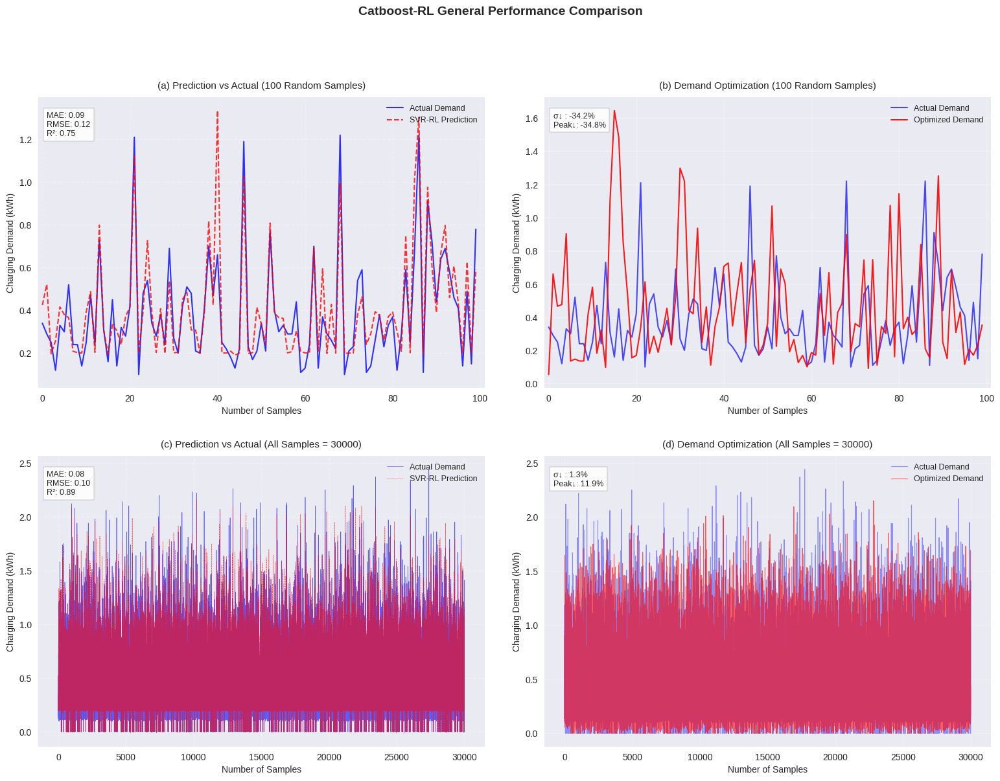


=== Model Performance Metrics ===
Average MAE: 0.0780
Average RMSE: 0.1033
Average R²: 0.8852

=== Optimization Statistics ===
Demand volatility reduction: 1.3%
Peak demand reduction: 11.9%
Average Price: 0.374 €/kWh
Price Elasticity: -0.189


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score


# Set up the figure and subplots
plt.figure(figsize=(16, 12))
plt.style.use('seaborn-v0_8')

# 1. Load data and results
df = pd.read_csv('/content/drive/MyDrive/EVD/data/helsinki_ev_data_price.csv')
df_subset = df.head(30000)

with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']

# Prepare data for all samples optimization plot
n_samples = len(results['test_results']['y_true'])
all_original_demand = []
all_rl_demands = []

k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
X = pd.DataFrame(np.zeros((n_samples, 7)))  # Adjust feature count as needed

for fold, (_, val_idx) in enumerate(kf.split(X)):
    original_demand_fold = all_y_test[val_idx]
    rl_demands_fold = results['rl_results']['demands'][fold]
    min_length = min(len(original_demand_fold), len(rl_demands_fold))
    all_original_demand.extend(original_demand_fold[:min_length])
    all_rl_demands.extend(rl_demands_fold[:min_length])

# Set up the figure and subplots with a main title
plt.figure(figsize=(16, 12))
plt.suptitle('Catboost-RL General Performance Comparison', y=1.02, fontsize=14, fontweight='bold')
# 1. First subplot: Prediction comparison (first 100 samples)
ax1 = plt.subplot(2, 2, 1)
ax1.plot(all_y_test[:100], 'b-', linewidth=1.5, alpha=0.8, label='Actual Demand')  # Blue
ax1.plot(all_test_preds[:100], 'r--', linewidth=1.5, alpha=0.8, label='SVR-RL Prediction')  # Red dashed
ax1.set_xlabel('Number of Samples', fontsize=10)
ax1.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax1.set_title('(a) Prediction vs Actual (100 Random Samples)', fontsize=11, pad=10)
ax1.legend(loc='upper right', fontsize=9, framealpha=1)  # Changed to upper right
ax1.grid(True, linestyle='--', alpha=0.3)
ax1.set_xlim(-1, 101)

# Calculate metrics for first 100 samples
mae_100 = mean_absolute_error(all_y_test[:100], all_test_preds[:100])
rmse_100 = np.sqrt(mean_squared_error(all_y_test[:100], all_test_preds[:100]))
r2_100 = r2_score(all_y_test[:100], all_test_preds[:100])

# Add metrics to plot (a) - now in top-left since legend is top-right
metrics_text_100 = (f'MAE: {mae_100:.2f}\n'
                   f'RMSE: {rmse_100:.2f}\n'
                   f'R²: {r2_100:.2f}')
ax1.text(0.02, 0.95, metrics_text_100, transform=ax1.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 2. Second subplot: Optimization comparison (first 100 samples)
ax2 = plt.subplot(2, 2, 2)
ax2.plot(all_y_test[:100], 'b-', alpha=0.7, label='Actual Demand', linewidth=1.5)  # Blue
ax2.plot(results['rl_results']['demands'][0][:100], 'r-', alpha=0.9,  # Red
         label='Optimized Demand', linewidth=1.5)
ax2.set_xlabel('Number of Samples', fontsize=10)
ax2.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax2.set_title('(b) Demand Optimization (100 Random Samples)', fontsize=11, pad=10)
ax2.legend(loc='upper right', fontsize=9, framealpha=1)
ax2.grid(alpha=0.3)
ax2.set_xlim(-1, 101)

# Calculate and show metrics for first 100 samples
first_100_actual = all_y_test[:100]
first_100_optimized = results['rl_results']['demands'][0][:100]
original_std_100 = np.std(first_100_actual)
rl_std_100 = np.std(first_100_optimized)
smoothing_percentage_100 = 100 * (original_std_100 - rl_std_100) / original_std_100
peak_reduction_100 = 100 * (1 - np.max(first_100_optimized)/np.max(first_100_actual))

metric_text_100 = (f'σ↓ : {smoothing_percentage_100:.1f}%\n'
                  f'Peak↓: {peak_reduction_100:.1f}%')
ax2.text(0.02, 0.95, metric_text_100, transform=ax2.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 3. Third subplot: Prediction comparison (all samples)
ax3 = plt.subplot(2, 2, 3)
ax3.plot(all_y_test, 'b-', linewidth=0.5, alpha=0.6, label='Actual Demand')  # Blue
ax3.plot(all_test_preds, 'r--', linewidth=0.5, alpha=0.6, label='SVR-RL Prediction')  # Red dashed
ax3.set_xlabel('Number of Samples', fontsize=10)
ax3.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax3.set_title('(c) Prediction vs Actual (All Samples = 30000)', fontsize=11, pad=10)
ax3.legend(loc='upper right', fontsize=9, framealpha=1)  # Changed to upper right
ax3.grid(True, linestyle='--', alpha=0.3)

# Calculate metrics for all samples
mae_all = mean_absolute_error(all_y_test, all_test_preds)
rmse_all = np.sqrt(mean_squared_error(all_y_test, all_test_preds))
r2_all = r2_score(all_y_test, all_test_preds)

# Add metrics to plot (c) - now in top-left since legend is top-right
metrics_text_all = (f'MAE: {mae_all:.2f}\n'
                   f'RMSE: {rmse_all:.2f}\n'
                   f'R²: {r2_all:.2f}')
ax3.text(0.02, 0.95, metrics_text_all, transform=ax3.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 4. Fourth subplot: Optimization comparison (all samples)
ax4 = plt.subplot(2, 2, 4)
ax4.plot(all_original_demand, 'b-', alpha=0.4, label='Actual Demand', linewidth=0.8)  # Blue
ax4.plot(all_rl_demands, 'r-', alpha=0.6, label='Optimized Demand', linewidth=0.8)  # Red
ax4.set_xlabel('Number of Samples', fontsize=10)
ax4.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax4.set_title('(d) Demand Optimization (All Samples = 30000)', fontsize=11, pad=10)
ax4.legend(loc='upper right', fontsize=9, framealpha=1)
ax4.grid(alpha=0.2)

# Calculate and show metrics for all samples
original_std = np.std(all_original_demand)
rl_std = np.std(all_rl_demands)
smoothing_percentage = 100 * (original_std - rl_std) / original_std
peak_reduction = 100 * (1 - np.max(all_rl_demands)/np.max(all_original_demand))

metric_text = (f'σ↓ : {smoothing_percentage:.1f}%\n'
               f'Peak↓: {peak_reduction:.1f}%')
ax4.text(0.02, 0.95, metric_text, transform=ax4.transAxes,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
         fontsize=9, verticalalignment='top')

# Adjust layout and save
plt.tight_layout(pad=3.0)
plt.savefig('combined_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print metrics
print("\n=== Model Performance Metrics ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.4f}")
print(f"Average RMSE: {results['avg_test_metrics']['rmse']:.4f}")
print(f"Average R²: {results['avg_test_metrics']['r2']:.4f}")

print("\n=== Optimization Statistics ===")
print(f"Demand volatility reduction: {smoothing_percentage:.1f}%")
print(f"Peak demand reduction: {peak_reduction:.1f}%")
print(f"Average Price: {results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {results['rl_results']['elasticity']:.3f}")

<ipython-input-5-9c23c71f5fb7>:125: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


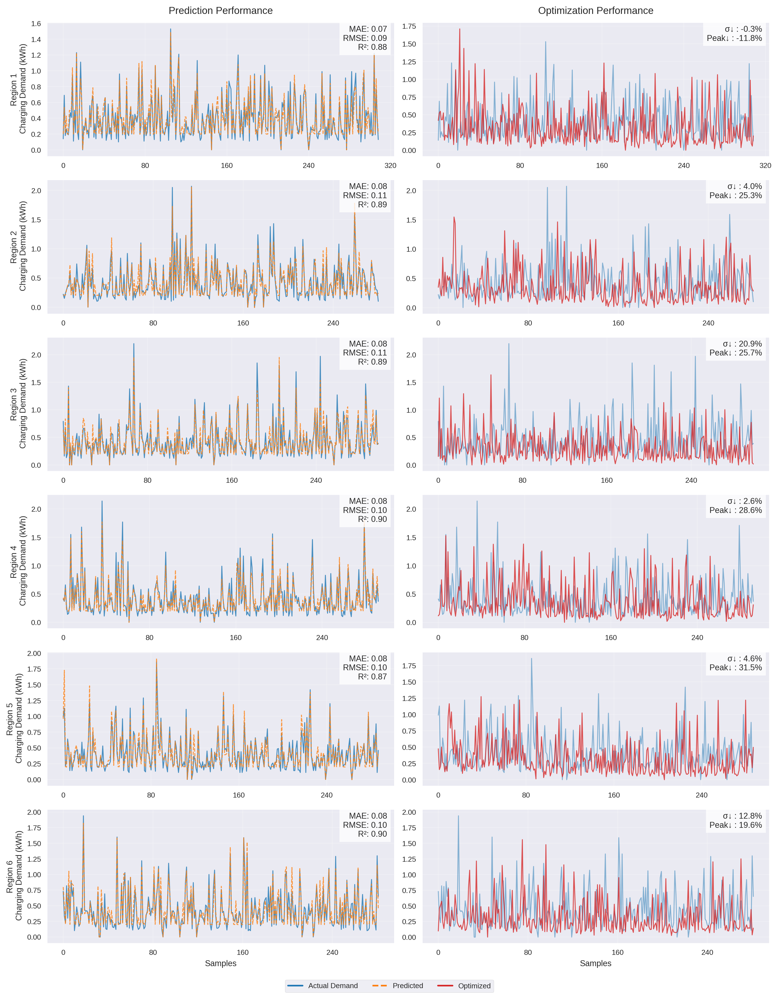


=== Model Performance Summary ===
Average MAE: 0.078 kWh
Average R²: 0.885

=== Optimization Results ===
Price Range: 0.200-0.400 €/kWh
Demand Change: -26.6%


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
from matplotlib.ticker import MaxNLocator

# Configuration
DATA_PATH = '/content/drive/MyDrive/EVD/data/'
RESULTS_PATH = DATA_PATH + 'saved_predictions/catboost_rl_50000_step_30000_data_results.pkl'
N_REGIONS = 6

def load_results(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Load data and results
df = pd.read_csv(DATA_PATH + "helsinki_ev_data_price.csv")
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_subset = df_shuffled.head(30000)
results = load_results(RESULTS_PATH)

# Set professional style
plt.style.use('seaborn-v0_8')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'grid.alpha': 0.3,
    'figure.constrained_layout.use': True
})

def plot_combined_regional_performance():
    """Combined plot of prediction and optimization performance by region"""
    # Prepare data
    y_true = results['test_results']['y_true']
    y_pred = results['test_results']['y_pred']
    rl_demands = np.concatenate(results['rl_results']['demands'])[:len(y_true)]
    region_ids = df_subset['Region_ID'].values[:len(y_true)]

    # Create figure with two columns
    fig, axs = plt.subplots(N_REGIONS, 2, figsize=(12, 2.5*N_REGIONS), dpi=300)
    #fig.suptitle('Catboost-RL Regional Performance Comparison', y=1.02, fontsize=12, fontweight='bold')

    # Column titles
    axs[0,0].set_title('Prediction Performance', pad=10, fontsize=11)
    axs[0,1].set_title('Optimization Performance', pad=10, fontsize=11)

    # Color scheme
    colors = {
        'true': '#1f77b4',  # Blue
        'pred': '#ff7f0e',  # Orange
        'opt': '#d62728'    # Red
    }

    for region_id in range(1, N_REGIONS+1):
        row_idx = region_id - 1
        region_mask = (region_ids == region_id)

        if not any(region_mask):
            axs[row_idx,0].axis('off')
            axs[row_idx,1].axis('off')
            continue

        # Get data for this region
        y_region = y_true[region_mask]
        pred_region = y_pred[region_mask]
        opt_region = rl_demands[region_mask]
        samples = np.arange(len(y_region))

        # --- Prediction Plot (Left) ---
        ax = axs[row_idx,0]
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.8, label='Actual', linewidth=1)
        ax.plot(samples, pred_region, '--', color=colors['pred'], alpha=0.8, label='Predicted', linewidth=1)

        # Metrics
        mae = mean_absolute_error(y_region, pred_region)
        rmse = np.sqrt(mean_squared_error(y_region, pred_region))
        r2 = r2_score(y_region, pred_region)

        ax.set_ylabel(f'Region {region_id}\n Charging Demand (kWh)', fontsize=9)
        ax.text(0.98, 0.98,  # x=0.98 (right edge), y=0.98 (top edge)
                f'MAE: {mae:.2f}\nRMSE: {rmse:.2f}\nR²: {r2:.2f}',
                transform=ax.transAxes,
                ha='right',  # horizontal alignment to right
                va='top',    # vertical alignment to top
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # --- Optimization Plot (Right) ---
        ax = axs[row_idx,1]
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.5, label='Original', linewidth=1)
        ax.plot(samples, opt_region, '-', color=colors['opt'], alpha=0.8, label='Optimized', linewidth=1)

        # Metrics
        smoothing = 100 * (np.std(y_region) - np.std(opt_region)) / np.std(y_region)
        peak_reduction = 100 * (1 - np.max(opt_region)/np.max(y_region))

        # For the Optimization Plot (Right)
        ax.text(0.98, 0.98,  # x=0.98 (right edge), y=0.98 (top edge)
                f'σ↓ : {smoothing:.1f}%\nPeak↓ : {peak_reduction:.1f}%',
                transform=ax.transAxes,
                ha='right',  # horizontal alignment to right
                va='top',    # vertical alignment to top
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Common formatting for both subplots
        for col in [0,1]:
            axs[row_idx,col].xaxis.set_major_locator(MaxNLocator(5))
            axs[row_idx,col].grid(True, alpha=0.2)
            if row_idx == N_REGIONS-1:
                axs[row_idx,col].set_xlabel('Samples', fontsize=9)

    # Add legend to the bottom
    handles = [
        plt.Line2D([], [], color=colors['true'], linestyle='-', label='Actual Demand'),
        plt.Line2D([], [], color=colors['pred'], linestyle='--', label='Predicted'),
        plt.Line2D([], [], color=colors['opt'], linestyle='-', label='Optimized')
    ]
    fig.legend(handles=handles, loc='lower center', ncol=3,
               bbox_to_anchor=(0.5, -0.02), frameon=True)

    plt.tight_layout()
    plt.savefig('combined_regional_performance.pdf', bbox_inches='tight')
    plt.savefig('combined_regional_performance.png', dpi=300)
    plt.show()

# Generate the combined plot
plot_combined_regional_performance()

# Print key statistics
print("\n=== Model Performance Summary ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.3f} kWh")
print(f"Average R²: {results['avg_test_metrics']['r2']:.3f}")
print(f"\n=== Optimization Results ===")
print(f"Price Range: {results['rl_results']['price_stats']['min']:.3f}-{results['rl_results']['price_stats']['max']:.3f} €/kWh")
demand_change = 100 * (np.mean(np.concatenate(results['rl_results']['demands'])) / np.mean(results['test_results']['y_true']) - 1)
print(f"Demand Change: {demand_change:.1f}%")

<ipython-input-6-489ba441193a>:123: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


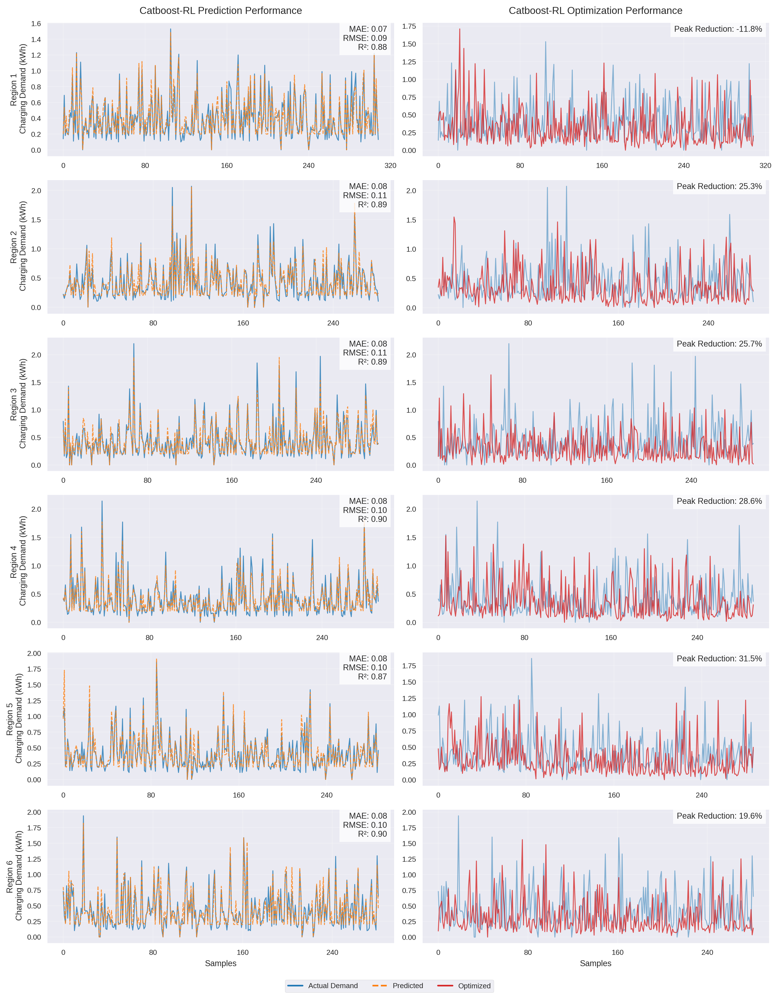


=== Model Performance Summary ===
Average MAE: 0.078 kWh
Average R²: 0.885

=== Optimization Results ===
Price Range: 0.200-0.400 €/kWh
Demand Change: -26.6%


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
from matplotlib.ticker import MaxNLocator

# Configuration
DATA_PATH = '/content/drive/MyDrive/EVD/data/'
RESULTS_PATH = DATA_PATH + 'saved_predictions/catboost_rl_50000_step_30000_data_results.pkl'
N_REGIONS = 6

def load_results(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Load data and results
df = pd.read_csv(DATA_PATH + "helsinki_ev_data_price.csv")
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_subset = df_shuffled.head(30000)
results = load_results(RESULTS_PATH)

# Set professional style
plt.style.use('seaborn-v0_8')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'grid.alpha': 0.3,
    'figure.constrained_layout.use': True
})

def plot_combined_regional_performance():
    """Combined plot of prediction and optimization performance by region"""
    # Prepare data
    y_true = results['test_results']['y_true']
    y_pred = results['test_results']['y_pred']
    rl_demands = np.concatenate(results['rl_results']['demands'])[:len(y_true)]
    region_ids = df_subset['Region_ID'].values[:len(y_true)]

    # Create figure with two columns
    fig, axs = plt.subplots(N_REGIONS, 2, figsize=(12, 2.5*N_REGIONS), dpi=300)
    #fig.suptitle('Catboost-RL Regional Performance Comparison', y=1.02, fontsize=12, fontweight='bold')

    # Column titles
    axs[0,0].set_title('Catboost-RL Prediction Performance', pad=10, fontsize=11)
    axs[0,1].set_title('Catboost-RL Optimization Performance', pad=10, fontsize=11)

    # Color scheme
    colors = {
        'true': '#1f77b4',  # Blue
        'pred': '#ff7f0e',  # Orange
        'opt': '#d62728'    # Red
    }

    for region_id in range(1, N_REGIONS+1):
        row_idx = region_id - 1
        region_mask = (region_ids == region_id)

        if not any(region_mask):
            axs[row_idx,0].axis('off')
            axs[row_idx,1].axis('off')
            continue

        # Get data for this region
        y_region = y_true[region_mask]
        pred_region = y_pred[region_mask]
        opt_region = rl_demands[region_mask]
        samples = np.arange(len(y_region))

        # --- Prediction Plot (Left) ---
        ax = axs[row_idx,0]
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.8, label='Actual', linewidth=1)
        ax.plot(samples, pred_region, '--', color=colors['pred'], alpha=0.8, label='Predicted', linewidth=1)

        # Metrics
        mae = mean_absolute_error(y_region, pred_region)
        rmse = np.sqrt(mean_squared_error(y_region, pred_region))
        r2 = r2_score(y_region, pred_region)

        ax.set_ylabel(f'Region {region_id}\n Charging Demand (kWh)', fontsize=9)
        ax.text(0.98, 0.98,  # x=0.98 (right edge), y=0.98 (top edge)
                f'MAE: {mae:.2f}\nRMSE: {rmse:.2f}\nR²: {r2:.2f}',
                transform=ax.transAxes,
                ha='right',  # horizontal alignment to right
                va='top',    # vertical alignment to top
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # --- Optimization Plot (Right) ---
        ax = axs[row_idx,1]
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.5, label='Original', linewidth=1)
        ax.plot(samples, opt_region, '-', color=colors['opt'], alpha=0.8, label='Optimized', linewidth=1)

        # Metrics - Only show peak reduction
        peak_reduction = 100 * (1 - np.max(opt_region)/np.max(y_region))

        ax.text(0.98, 0.98,  # x=0.98 (right edge), y=0.98 (top edge)
                f'Peak Reduction: {peak_reduction:.1f}%',
                transform=ax.transAxes,
                ha='right',  # horizontal alignment to right
                va='top',    # vertical alignment to top
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Common formatting for both subplots
        for col in [0,1]:
            axs[row_idx,col].xaxis.set_major_locator(MaxNLocator(5))
            axs[row_idx,col].grid(True, alpha=0.2)
            if row_idx == N_REGIONS-1:
                axs[row_idx,col].set_xlabel('Samples', fontsize=9)

    # Add legend to the bottom
    handles = [
        plt.Line2D([], [], color=colors['true'], linestyle='-', label='Actual Demand'),
        plt.Line2D([], [], color=colors['pred'], linestyle='--', label='Predicted'),
        plt.Line2D([], [], color=colors['opt'], linestyle='-', label='Optimized')
    ]
    fig.legend(handles=handles, loc='lower center', ncol=3,
               bbox_to_anchor=(0.5, -0.02), frameon=True)

    plt.tight_layout()
    plt.savefig('combined_regional_performance.pdf', bbox_inches='tight')
    plt.savefig('combined_regional_performance.png', dpi=300)
    plt.show()

# Generate the combined plot
plot_combined_regional_performance()

# Print key statistics
print("\n=== Model Performance Summary ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.3f} kWh")
print(f"Average R²: {results['avg_test_metrics']['r2']:.3f}")
print(f"\n=== Optimization Results ===")
print(f"Price Range: {results['rl_results']['price_stats']['min']:.3f}-{results['rl_results']['price_stats']['max']:.3f} €/kWh")
demand_change = 100 * (np.mean(np.concatenate(results['rl_results']['demands'])) / np.mean(results['test_results']['y_true']) - 1)
print(f"Demand Change: {demand_change:.1f}%")

<Figure size 1600x1200 with 0 Axes>

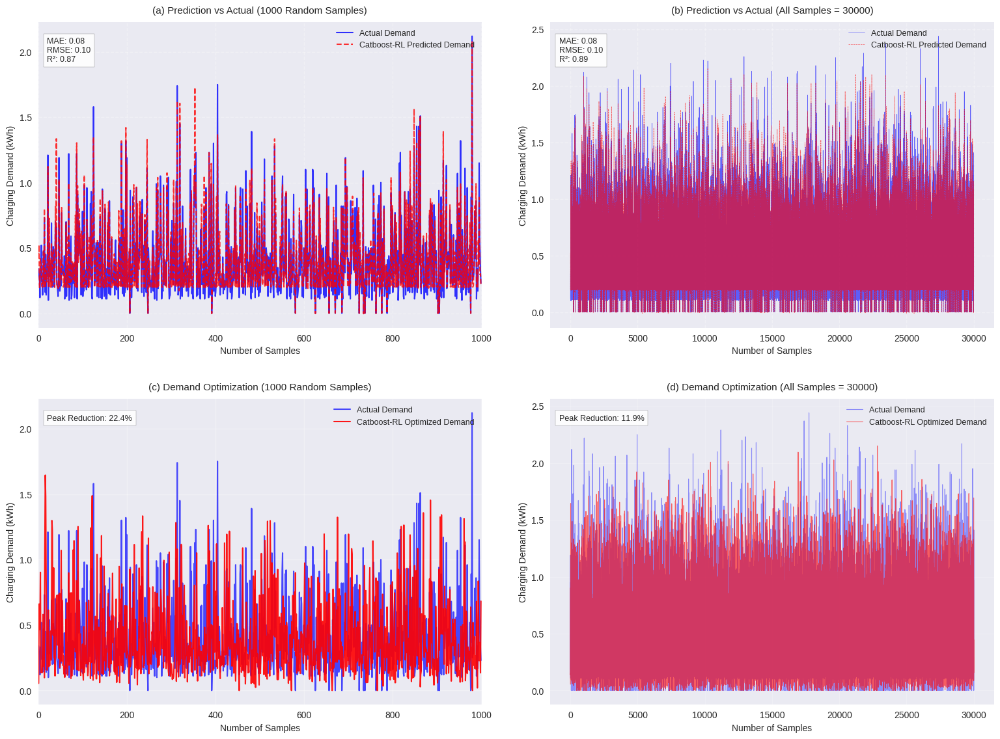


=== Model Performance Metrics ===
Average MAE: 0.0780
Average RMSE: 0.1033
Average R²: 0.8852

=== Optimization Statistics ===
Peak demand reduction: 11.9%
Average Price: 0.374 €/kWh
Price Elasticity: -0.189


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Set up the figure and subplots
plt.figure(figsize=(16, 12))
plt.style.use('seaborn-v0_8')

# 1. Load data and results
df = pd.read_csv('/content/drive/MyDrive/EVD/data/helsinki_ev_data_price.csv')
df_subset = df.head(30000)

with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']

# Prepare data for all samples optimization plot
n_samples = len(results['test_results']['y_true'])
all_original_demand = []
all_rl_demands = []

k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
X = pd.DataFrame(np.zeros((n_samples, 7)))

for fold, (_, val_idx) in enumerate(kf.split(X)):
    original_demand_fold = all_y_test[val_idx]
    rl_demands_fold = results['rl_results']['demands'][fold]
    min_length = min(len(original_demand_fold), len(rl_demands_fold))
    all_original_demand.extend(original_demand_fold[:min_length])
    all_rl_demands.extend(rl_demands_fold[:min_length])

# Set up the figure and subplots
plt.figure(figsize=(16, 12))

# 1. (a) Top-left: Prediction comparison (first 1000 samples)
ax1 = plt.subplot(2, 2, 1)
ax1.plot(all_y_test[:1000], 'b-', linewidth=1.5, alpha=0.8, label='Actual Demand')
ax1.plot(all_test_preds[:1000], 'r--', linewidth=1.5, alpha=0.8, label='Catboost-RL Predicted Demand')
ax1.set_xlabel('Number of Samples', fontsize=10)
ax1.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax1.set_title('(a) Prediction vs Actual (1000 Random Samples)', fontsize=11, pad=10)
ax1.legend(loc='upper right', fontsize=9, framealpha=1)
ax1.grid(True, linestyle='--', alpha=0.3)
ax1.set_xlim(-1, 1001)

# Metrics for (a)
mae_1000 = mean_absolute_error(all_y_test[:1000], all_test_preds[:1000])
rmse_1000 = np.sqrt(mean_squared_error(all_y_test[:1000], all_test_preds[:1000]))
r2_1000 = r2_score(all_y_test[:1000], all_test_preds[:1000])

metrics_text_1000 = (f'MAE: {mae_1000:.2f}\nRMSE: {rmse_1000:.2f}\nR²: {r2_1000:.2f}')
ax1.text(0.02, 0.95, metrics_text_1000, transform=ax1.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 2. (b) Top-right: Prediction comparison (all samples)
ax2 = plt.subplot(2, 2, 2)
ax2.plot(all_y_test, 'b-', linewidth=0.5, alpha=0.6, label='Actual Demand')
ax2.plot(all_test_preds, 'r--', linewidth=0.5, alpha=0.6, label='Catboost-RL Predicted Demand')
ax2.set_xlabel('Number of Samples', fontsize=10)
ax2.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax2.set_title('(b) Prediction vs Actual (All Samples = 30000)', fontsize=11, pad=10)
ax2.legend(loc='upper right', fontsize=9, framealpha=1)
ax2.grid(True, linestyle='--', alpha=0.3)

# Metrics for (b)
mae_all = mean_absolute_error(all_y_test, all_test_preds)
rmse_all = np.sqrt(mean_squared_error(all_y_test, all_test_preds))
r2_all = r2_score(all_y_test, all_test_preds)

metrics_text_all = (f'MAE: {mae_all:.2f}\nRMSE: {rmse_all:.2f}\nR²: {r2_all:.2f}')
ax2.text(0.02, 0.95, metrics_text_all, transform=ax2.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 3. (c) Bottom-left: Demand optimization (first 1000 samples)
ax3 = plt.subplot(2, 2, 3)
ax3.plot(all_y_test[:1000], 'b-', alpha=0.7, label='Actual Demand', linewidth=1.5)
ax3.plot(results['rl_results']['demands'][0][:1000], 'r-', alpha=0.9, label='Catboost-RL Optimized Demand', linewidth=1.5)
ax3.set_xlabel('Number of Samples', fontsize=10)
ax3.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax3.set_title('(c) Demand Optimization (1000 Random Samples)', fontsize=11, pad=10)
ax3.legend(loc='upper right', fontsize=9, framealpha=1)
ax3.grid(alpha=0.3)
ax3.set_xlim(-1, 1001)

# Metrics for (c) - Only peak reduction
first_1000_actual = all_y_test[:1000]
first_1000_optimized = results['rl_results']['demands'][0][:1000]
peak_reduction_1000 = 100 * (1 - np.max(first_1000_optimized)/np.max(first_1000_actual))

metric_text_1000 = f'Peak Reduction: {peak_reduction_1000:.1f}%'
ax3.text(0.02, 0.95, metric_text_1000, transform=ax3.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 4. (d) Bottom-right: Demand optimization (all samples)
ax4 = plt.subplot(2, 2, 4)
ax4.plot(all_original_demand, 'b-', alpha=0.4, label='Actual Demand', linewidth=0.8)
ax4.plot(all_rl_demands, 'r-', alpha=0.6, label='Catboost-RL Optimized Demand', linewidth=0.8)
ax4.set_xlabel('Number of Samples', fontsize=10)
ax4.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax4.set_title('(d) Demand Optimization (All Samples = 30000)', fontsize=11, pad=10)
ax4.legend(loc='upper right', fontsize=9, framealpha=1)
ax4.grid(alpha=0.2)

# Metrics for (d) - Only peak reduction
peak_reduction = 100 * (1 - np.max(all_rl_demands)/np.max(all_original_demand))

metric_text = f'Peak Reduction: {peak_reduction:.1f}%'
ax4.text(0.02, 0.95, metric_text, transform=ax4.transAxes,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
         fontsize=9, verticalalignment='top')

# Adjust layout and save
plt.tight_layout(pad=3.0)
plt.savefig('combined_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print metrics
print("\n=== Model Performance Metrics ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.4f}")
print(f"Average RMSE: {results['avg_test_metrics']['rmse']:.4f}")
print(f"Average R²: {results['avg_test_metrics']['r2']:.4f}")

print("\n=== Optimization Statistics ===")
print(f"Peak demand reduction: {peak_reduction:.1f}%")
print(f"Average Price: {results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {results['rl_results']['elasticity']:.3f}")

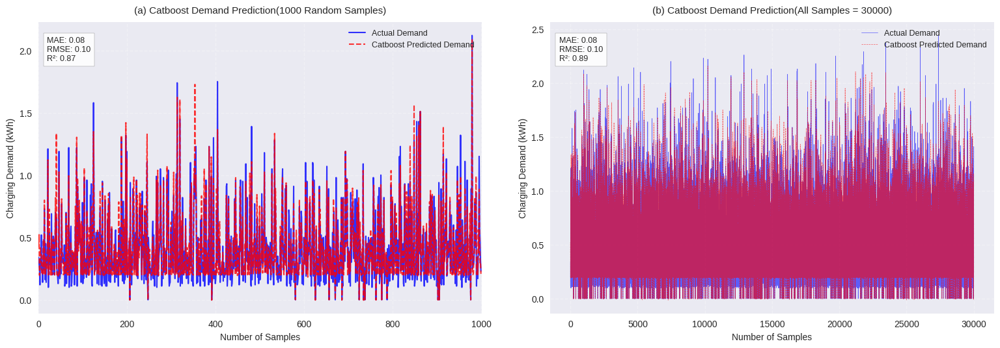


=== Model Performance Metrics ===
Average MAE: 0.0780
Average RMSE: 0.1033
Average R²: 0.8852


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Set up the figure and subplots
plt.figure(figsize=(16, 6))
plt.style.use('seaborn-v0_8')

# 1. Load data and results
df = pd.read_csv('/content/drive/MyDrive/EVD/data/helsinki_ev_data_price.csv')
df_subset = df.head(30000)

with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    results = pickle.load(f)

all_y_test = results['test_results']['y_true']
all_test_preds = results['test_results']['y_pred']

# 1. (a) Left: Prediction comparison (first 1000 samples)
ax1 = plt.subplot(1, 2, 1)
ax1.plot(all_y_test[:1000], 'b-', linewidth=1.5, alpha=0.8, label='Actual Demand')
ax1.plot(all_test_preds[:1000], 'r--', linewidth=1.5, alpha=0.8, label='Catboost Predicted Demand')
ax1.set_xlabel('Number of Samples', fontsize=10)
ax1.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax1.set_title('(a) Catboost Demand Prediction(1000 Random Samples)', fontsize=11, pad=10)
ax1.legend(loc='upper right', fontsize=9, framealpha=1)
ax1.grid(True, linestyle='--', alpha=0.3)
ax1.set_xlim(-1, 1001)

# Metrics for (a)
mae_1000 = mean_absolute_error(all_y_test[:1000], all_test_preds[:1000])
rmse_1000 = np.sqrt(mean_squared_error(all_y_test[:1000], all_test_preds[:1000]))
r2_1000 = r2_score(all_y_test[:1000], all_test_preds[:1000])

metrics_text_1000 = (f'MAE: {mae_1000:.2f}\nRMSE: {rmse_1000:.2f}\nR²: {r2_1000:.2f}')
ax1.text(0.02, 0.95, metrics_text_1000, transform=ax1.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# 2. (b) Right: Prediction comparison (all samples)
ax2 = plt.subplot(1, 2, 2)
ax2.plot(all_y_test, 'b-', linewidth=0.5, alpha=0.6, label='Actual Demand')
ax2.plot(all_test_preds, 'r--', linewidth=0.5, alpha=0.6, label='Catboost Predicted Demand')
ax2.set_xlabel('Number of Samples', fontsize=10)
ax2.set_ylabel('Charging Demand (kWh)', fontsize=10)
ax2.set_title('(b) Catboost Demand Prediction(All Samples = 30000)', fontsize=11, pad=10)
ax2.legend(loc='upper right', fontsize=9, framealpha=1)
ax2.grid(True, linestyle='--', alpha=0.3)

# Metrics for (b)
mae_all = mean_absolute_error(all_y_test, all_test_preds)
rmse_all = np.sqrt(mean_squared_error(all_y_test, all_test_preds))
r2_all = r2_score(all_y_test, all_test_preds)

metrics_text_all = (f'MAE: {mae_all:.2f}\nRMSE: {rmse_all:.2f}\nR²: {r2_all:.2f}')
ax2.text(0.02, 0.95, metrics_text_all, transform=ax2.transAxes,
        bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
        fontsize=9, verticalalignment='top')

# Adjust layout and save
plt.tight_layout(pad=3.0)
plt.savefig('prediction_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print metrics
print("\n=== Model Performance Metrics ===")
print(f"Average MAE: {results['avg_test_metrics']['mae']:.4f}")
print(f"Average RMSE: {results['avg_test_metrics']['rmse']:.4f}")
print(f"Average R²: {results['avg_test_metrics']['r2']:.4f}")

<ipython-input-5-ef7cd87ee100>:39: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.3, wspace=0.2)
<ipython-input-5-ef7cd87ee100>:97: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


<Figure size 1600x600 with 0 Axes>

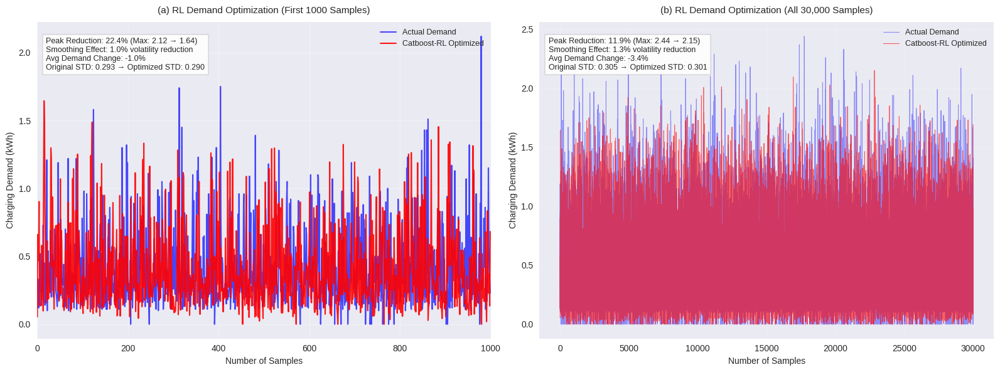


=== RL Optimization Statistics ===
Peak demand reduction: 11.9%
Average Price: 0.374 €/kWh
Price Elasticity: -0.189


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

plt.figure(figsize=(16, 6))  # Adjusted figure size for 1 row of plots
plt.style.use('seaborn-v0_8')

# ==============================================
# Part 1: CatBoost-RL results
# ==============================================
with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    rl_results = pickle.load(f)

all_y_test_rl = rl_results['test_results']['y_true']

# Prepare data for all samples optimization plot
n_samples = len(all_y_test_rl)
all_original_demand_rl = []
all_rl_demands = []

k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
X = pd.DataFrame(np.zeros((n_samples, 7)))

for fold, (_, val_idx) in enumerate(kf.split(X)):
    original_demand_fold = all_y_test_rl[val_idx]
    rl_demands_fold = rl_results['rl_results']['demands'][fold]
    min_length = min(len(original_demand_fold), len(rl_demands_fold))
    all_original_demand_rl.extend(original_demand_fold[:min_length])
    all_rl_demands.extend(rl_demands_fold[:min_length])

# ==============================================
# Create the RL plots only (1x2 grid)
# ==============================================
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.2)

# (a) RL first 1000 samples
axs[0].plot(all_y_test_rl[:1000], 'b-', alpha=0.7, label='Actual Demand', linewidth=1.5)
axs[0].plot(rl_results['rl_results']['demands'][0][:1000], 'r-', alpha=0.9, label='Catboost-RL Optimized', linewidth=1.5)
axs[0].set_xlabel('Number of Samples', fontsize=10)
axs[0].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[0].set_title('(a) RL Demand Optimization (First 1000 Samples)', fontsize=11, pad=10)
axs[0].legend(loc='upper right', fontsize=9, framealpha=1)
axs[0].grid(alpha=0.3)
axs[0].set_xlim(-1, 1001)

# Metrics for (a)
first_1000_actual_rl = all_y_test_rl[:1000]
first_1000_optimized_rl = rl_results['rl_results']['demands'][0][:1000]
peak_reduction_1000_rl = 100 * (1 - np.max(first_1000_optimized_rl)/np.max(first_1000_actual_rl))
original_std_1000_rl = np.std(first_1000_actual_rl)
optimized_std_1000_rl = np.std(first_1000_optimized_rl)
smoothing_1000_rl = 100 * (1 - (optimized_std_1000_rl/original_std_1000_rl))
avg_demand_change_1000_rl = 100 * ((np.mean(first_1000_optimized_rl) - np.mean(first_1000_actual_rl))/np.mean(first_1000_actual_rl))

metric_text_1000_rl = (
    f'Peak Reduction: {peak_reduction_1000_rl:.1f}% (Max: {np.max(first_1000_actual_rl):.2f} → {np.max(first_1000_optimized_rl):.2f})\n'
    f'Smoothing Effect: {smoothing_1000_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_1000_rl:+.1f}%\n'
    f'Original STD: {original_std_1000_rl:.3f} → Optimized STD: {optimized_std_1000_rl:.3f}'
)
axs[0].text(0.02, 0.95, metric_text_1000_rl, transform=axs[0].transAxes,
          bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
          fontsize=9, verticalalignment='top')

# (b) RL all samples
axs[1].plot(all_original_demand_rl, 'b-', alpha=0.4, label='Actual Demand', linewidth=0.8)
axs[1].plot(all_rl_demands, 'r-', alpha=0.6, label='Catboost-RL Optimized', linewidth=0.8)
axs[1].set_xlabel('Number of Samples', fontsize=10)
axs[1].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[1].set_title('(b) RL Demand Optimization (All 30,000 Samples)', fontsize=11, pad=10)
axs[1].legend(loc='upper right', fontsize=9, framealpha=1)
axs[1].grid(alpha=0.2)

# Metrics for (b)
peak_reduction_rl = 100 * (1 - np.max(all_rl_demands)/np.max(all_original_demand_rl))
original_std_rl = np.std(all_original_demand_rl)
optimized_std_rl = np.std(all_rl_demands)
smoothing_rl = 100 * (1 - (optimized_std_rl/original_std_rl))
avg_demand_change_rl = 100 * ((np.mean(all_rl_demands) - np.mean(all_original_demand_rl))/np.mean(all_original_demand_rl))

metric_text_rl = (
    f'Peak Reduction: {peak_reduction_rl:.1f}% (Max: {np.max(all_original_demand_rl):.2f} → {np.max(all_rl_demands):.2f})\n'
    f'Smoothing Effect: {smoothing_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_rl:+.1f}%\n'
    f'Original STD: {original_std_rl:.3f} → Optimized STD: {optimized_std_rl:.3f}'
)
axs[1].text(0.02, 0.95, metric_text_rl, transform=axs[1].transAxes,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
         fontsize=9, verticalalignment='top')

# Save and show
plt.tight_layout()
plt.savefig('rl_optimization_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print optimization statistics
print("\n=== RL Optimization Statistics ===")
print(f"Peak demand reduction: {peak_reduction_rl:.1f}%")
print(f"Average Price: {rl_results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {rl_results['rl_results']['elasticity']:.3f}")

<ipython-input-3-3965569c4689>:109: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


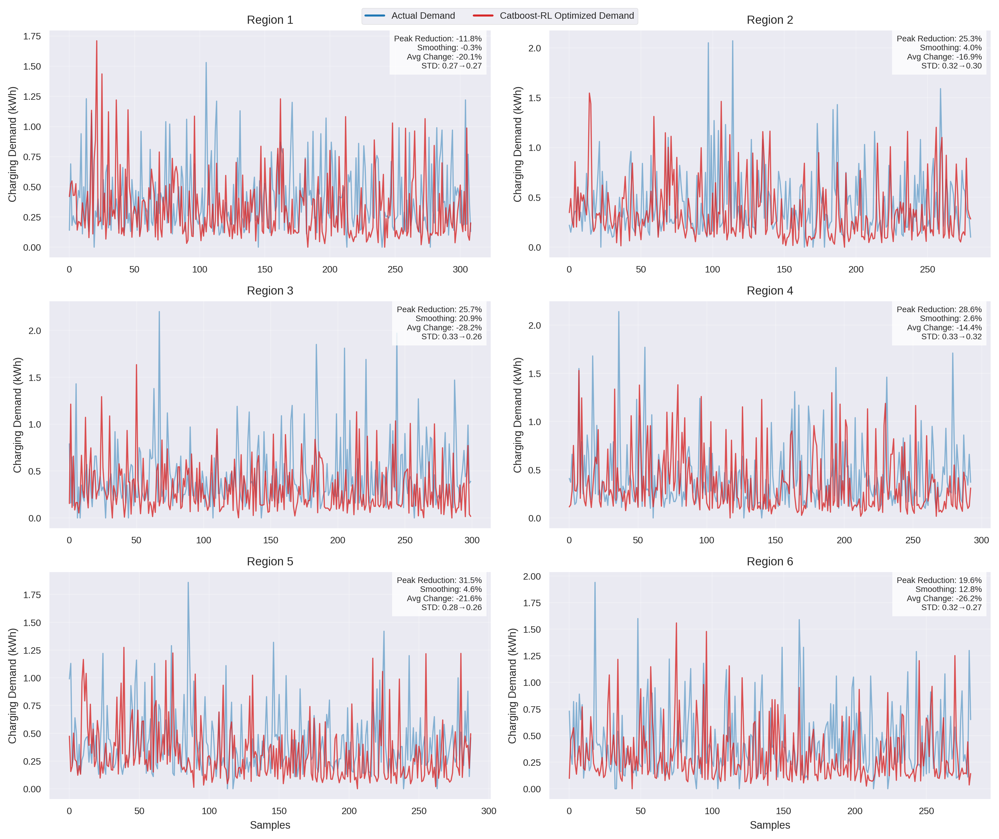


=== RL Optimization Results ===
Price Range: 0.200-0.400 €/kWh
Average Price: 0.374 €/kWh
Price Elasticity: -0.189
Demand Change: -26.6%


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.ticker import MaxNLocator

# Configuration
DATA_PATH = '/content/drive/MyDrive/EVD/data/'
RL_RESULTS_PATH = DATA_PATH + 'saved_predictions/catboost_rl_50000_step_30000_data_results.pkl'
N_REGIONS = 6

def load_results(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Load data and results
df = pd.read_csv(DATA_PATH + "helsinki_ev_data_price.csv")
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_subset = df_shuffled.head(30000)
rl_results = load_results(RL_RESULTS_PATH)

# Set professional style
plt.style.use('seaborn-v0_8')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'grid.alpha': 0.3,
    'figure.constrained_layout.use': True
})

def plot_rl_performance_2x3():
    """Plot of RL optimization performance in 2x3 grid"""
    # Prepare data
    y_true = rl_results['test_results']['y_true']
    rl_demands = np.concatenate(rl_results['rl_results']['demands'])[:len(y_true)]
    region_ids = df_subset['Region_ID'].values[:len(y_true)]

    # Create figure with 2 columns and 3 rows
    fig, axs = plt.subplots(3, 2, figsize=(12, 10), dpi=300)
    axs = axs.ravel()  # Flatten the array for easier indexing

    # Main title
    #fig.suptitle('Reinforcement Learning (RL) Approach Performance by Region', y=1.02, fontsize=11)

    # Color scheme
    colors = {
        'true': '#1f77b4',  # Blue
        'opt': '#d62728'    # Red
    }

    # Add legend at the top center
    handles = [
        plt.Line2D([], [], color=colors['true'], linestyle='-', label='Actual Demand'),
        plt.Line2D([], [], color=colors['opt'], linestyle='-', label='Catboost-RL Optimized Demand')
    ]
    fig.legend(handles=handles, loc='upper center', ncol=2,
               bbox_to_anchor=(0.5, 1.0), frameon=True)

    for region_id in range(1, N_REGIONS+1):
        ax = axs[region_id-1]  # Get current axis
        region_mask = (region_ids == region_id)

        if not any(region_mask):
            ax.axis('off')
            continue

        # Get data for this region
        y_region = y_true[region_mask]
        rl_region = rl_demands[region_mask]
        samples = np.arange(len(y_region))

        # Plot data
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.5, label='Original', linewidth=1)
        ax.plot(samples, rl_region, '-', color=colors['opt'], alpha=0.8, label='Optimized', linewidth=1)

        # RL Metrics
        original_std = np.std(y_region)
        optimized_std = np.std(rl_region)
        smoothing = 100 * (1 - (optimized_std/original_std)) if original_std > 0 else 0
        peak_reduction = 100 * (1 - np.max(rl_region)/np.max(y_region)) if np.max(y_region) > 0 else 0
        avg_demand_change = 100 * ((np.mean(rl_region) - np.mean(y_region))/np.mean(y_region)) if np.mean(y_region) > 0 else 0

        rl_metric_text = (
            f'Peak Reduction: {peak_reduction:.1f}%\n'
            f'Smoothing: {smoothing:.1f}%\n'
            f'Avg Change: {avg_demand_change:+.1f}%\n'
            f'STD: {original_std:.2f}→{optimized_std:.2f}'
        )

        ax.text(0.98, 0.98,
                rl_metric_text,
                transform=ax.transAxes,
                ha='right', va='top',
                fontsize=7,
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        ax.set_title(f'Region {region_id}', pad=6)
        ax.set_ylabel('Charging Demand (kWh)')
        ax.grid(True, alpha=0.2)

        # Only show xlabel on bottom row
        if region_id in [5, 6]:
            ax.set_xlabel('Samples')

    plt.tight_layout()
    plt.savefig('rl_optimization_performance_2x3.pdf', bbox_inches='tight')
    plt.savefig('rl_optimization_performance_2x3.png', dpi=300)
    plt.show()

# Generate the RL performance plot in 2x3 layout
plot_rl_performance_2x3()

# Print key statistics
print("\n=== RL Optimization Results ===")
print(f"Price Range: {rl_results['rl_results']['price_stats']['min']:.3f}-{rl_results['rl_results']['price_stats']['max']:.3f} €/kWh")
print(f"Average Price: {rl_results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {rl_results['rl_results']['elasticity']:.3f}")
rl_demand_change = 100 * (np.mean(np.concatenate(rl_results['rl_results']['demands'])) / np.mean(rl_results['test_results']['y_true']) - 1)
print(f"Demand Change: {rl_demand_change:.1f}%")

<ipython-input-7-f96dfe09b3e5>:101: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


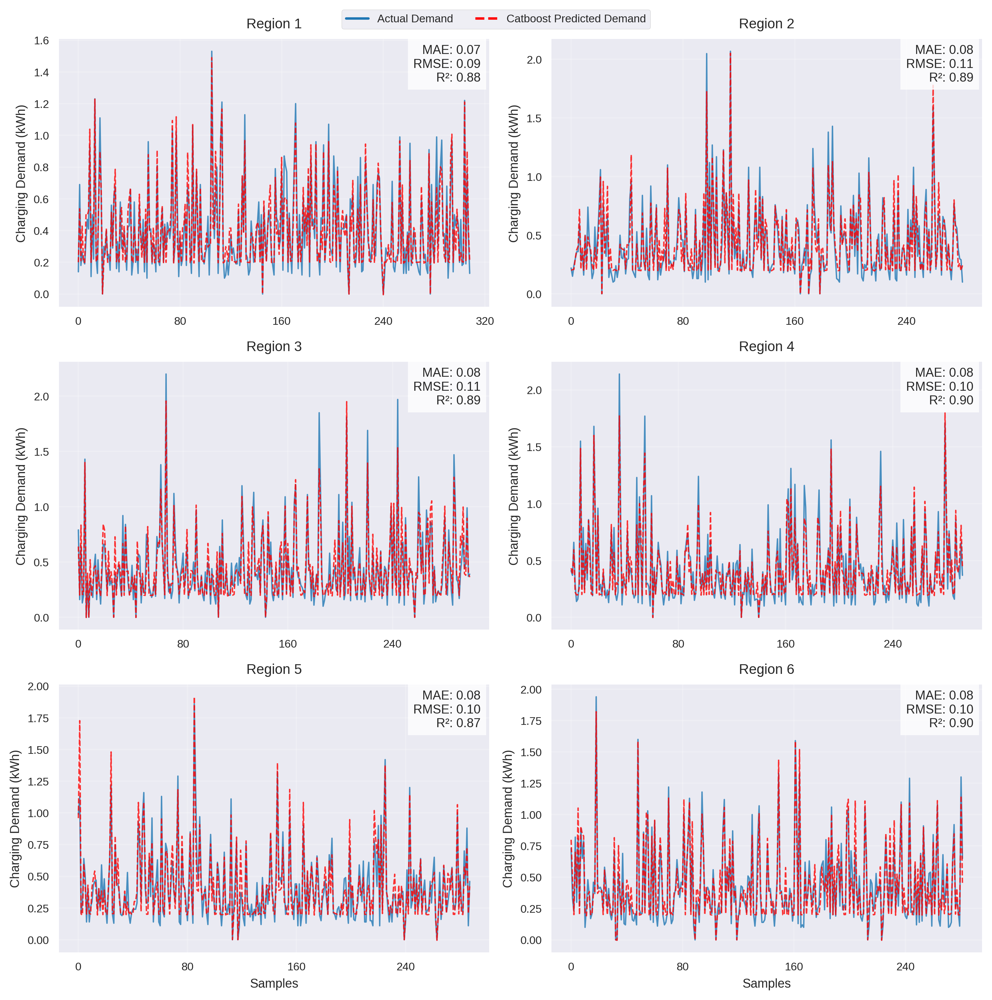


=== CatBoost-LP Model Performance Summary ===
Average MAE: 0.078 kWh
Average R²: 0.885


In [ ]:
import pickle
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import pandas as pd
from matplotlib.ticker import MaxNLocator

# Configuration
DATA_PATH = '/content/drive/MyDrive/EVD/data/'
RESULTS_PATH = DATA_PATH + 'saved_predictions/catboost_rl_50000_step_30000_data_results.pkl'
N_REGIONS = 6

def load_results(file_path):
    with open(file_path, 'rb') as f:
        return pickle.load(f)

# Load data and results
df = pd.read_csv(DATA_PATH + "helsinki_ev_data_price.csv")
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
df_subset = df_shuffled.head(30000)
results = load_results(RESULTS_PATH)

# Set professional style
plt.style.use('seaborn-v0_8')
plt.rcParams.update({
    'font.size': 9,
    'axes.titlesize': 10,
    'axes.labelsize': 9,
    'xtick.labelsize': 8,
    'ytick.labelsize': 8,
    'legend.fontsize': 8,
    'grid.alpha': 0.3,
    'figure.constrained_layout.use': True
})

def plot_prediction_performance():
    """Plot of prediction performance by region in 2x3 grid"""
    # Prepare data
    y_true = results['test_results']['y_true']
    y_pred = results['test_results']['y_pred']
    region_ids = df_subset['Region_ID'].values[:len(y_true)]

    # Create figure with 2 columns and 3 rows
    fig, axs = plt.subplots(3, 2, figsize=(10, 10), dpi=300)
    #fig.suptitle('CatBoost-LP Prediction Performance by Region', y=1.02, fontsize=12)

    # Flatten the axes array for easier iteration
    axs = axs.flatten()

    # Color scheme - changed 'pred' color to red
    colors = {
        'true': '#1f77b4',  # Blue
        'pred': '#ff0000'   # Red (changed from orange)
    }

    for region_id in range(1, N_REGIONS+1):
        ax = axs[region_id-1]  # Get the appropriate subplot
        region_mask = (region_ids == region_id)

        if not any(region_mask):
            ax.axis('off')
            continue

        # Get data for this region
        y_region = y_true[region_mask]
        pred_region = y_pred[region_mask]
        samples = np.arange(len(y_region))

        # Plot actual vs predicted
        ax.plot(samples, y_region, '-', color=colors['true'], alpha=0.8, label='Actual', linewidth=1)
        ax.plot(samples, pred_region, '--', color=colors['pred'], alpha=0.8, label='Predicted', linewidth=1)

        # Calculate and display metrics
        mae = mean_absolute_error(y_region, pred_region)
        rmse = np.sqrt(mean_squared_error(y_region, pred_region))
        r2 = r2_score(y_region, pred_region)

        ax.set_title(f'Region {region_id}', pad=8, fontsize=10)
        ax.set_ylabel('Charging Demand (kWh)', fontsize=9)
        ax.text(0.98, 0.98,
                f'MAE: {mae:.2f}\nRMSE: {rmse:.2f}\nR²: {r2:.2f}',
                transform=ax.transAxes,
                ha='right',
                va='top',
                bbox=dict(facecolor='white', alpha=0.8, edgecolor='none'))

        # Formatting
        ax.xaxis.set_major_locator(MaxNLocator(5))
        ax.grid(True, alpha=0.2)
        if region_id in [5, 6]:  # Only label x-axis for bottom row
            ax.set_xlabel('Samples', fontsize=9)

    # Add legend below the plots
    handles = [
        plt.Line2D([], [], color=colors['true'], linestyle='-', label='Actual Demand'),
        plt.Line2D([], [], color=colors['pred'], linestyle='--', label='Catboost Predicted Demand')
    ]
    fig.legend(handles=handles, loc='upper center', ncol=2,
               bbox_to_anchor=(0.5, 1.0), frameon=True)

    plt.tight_layout()
    plt.savefig('prediction_performance_grid.pdf', bbox_inches='tight')
    plt.savefig('prediction_performance_grid.png', dpi=300)
    plt.show()

# Generate the prediction performance plot
plot_prediction_performance()

# Print key statistics
print("\n=== CatBoost-LP Model Performance Summary ===")
print(f"Average MAE: {np.mean([res['mae'] for res in results['test_results']['metrics']]):.3f} kWh")
print(f"Average R²: {np.mean([res['r2'] for res in results['test_results']['metrics']]):.3f}")

<Figure size 1600x600 with 0 Axes>

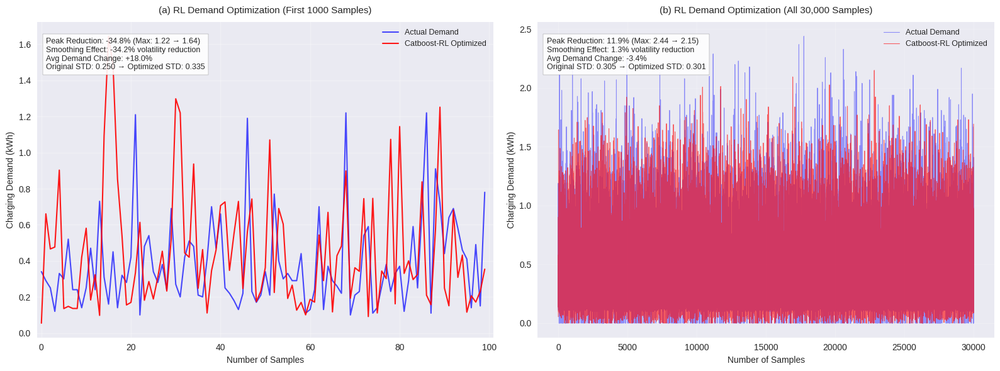


=== RL Optimization Statistics ===
Peak demand reduction: 11.9%
Average Price: 0.374 €/kWh
Price Elasticity: -0.189


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

plt.figure(figsize=(16, 6))  # Adjusted figure size for 1 row of plots
plt.style.use('seaborn-v0_8')

# ==============================================
# Part 1: CatBoost-RL results
# ==============================================
with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    rl_results = pickle.load(f)

all_y_test_rl = rl_results['test_results']['y_true']

# Prepare data for all samples optimization plot
n_samples = len(all_y_test_rl)
all_original_demand_rl = []
all_rl_demands = []

k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
X = pd.DataFrame(np.zeros((n_samples, 7)))

for fold, (_, val_idx) in enumerate(kf.split(X)):
    original_demand_fold = all_y_test_rl[val_idx]
    rl_demands_fold = rl_results['rl_results']['demands'][fold]
    min_length = min(len(original_demand_fold), len(rl_demands_fold))
    all_original_demand_rl.extend(original_demand_fold[:min_length])
    all_rl_demands.extend(rl_demands_fold[:min_length])

# ==============================================
# Create the RL plots only (1x2 grid)
# ==============================================
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.2)

# (a) RL first 1000 samples
axs[0].plot(all_y_test_rl[:100], 'b-', alpha=0.7, label='Actual Demand', linewidth=1.5)
axs[0].plot(rl_results['rl_results']['demands'][0][:100], 'r-', alpha=0.9, label='Catboost-RL Optimized', linewidth=1.5)
axs[0].set_xlabel('Number of Samples', fontsize=10)
axs[0].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[0].set_title('(a) RL Demand Optimization (First 1000 Samples)', fontsize=11, pad=10)
axs[0].legend(loc='upper right', fontsize=9, framealpha=1)
axs[0].grid(alpha=0.3)
axs[0].set_xlim(-1, 101)

# Metrics for (a)
first_1000_actual_rl = all_y_test_rl[:100]
first_1000_optimized_rl = rl_results['rl_results']['demands'][0][:100]
peak_reduction_1000_rl = 100 * (1 - np.max(first_1000_optimized_rl)/np.max(first_1000_actual_rl))
original_std_1000_rl = np.std(first_1000_actual_rl)
optimized_std_1000_rl = np.std(first_1000_optimized_rl)
smoothing_1000_rl = 100 * (1 - (optimized_std_1000_rl/original_std_1000_rl))
avg_demand_change_1000_rl = 100 * ((np.mean(first_1000_optimized_rl) - np.mean(first_1000_actual_rl))/np.mean(first_1000_actual_rl))

metric_text_1000_rl = (
    f'Peak Reduction: {peak_reduction_1000_rl:.1f}% (Max: {np.max(first_1000_actual_rl):.2f} → {np.max(first_1000_optimized_rl):.2f})\n'
    f'Smoothing Effect: {smoothing_1000_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_1000_rl:+.1f}%\n'
    f'Original STD: {original_std_1000_rl:.3f} → Optimized STD: {optimized_std_1000_rl:.3f}'
)
axs[0].text(0.02, 0.95, metric_text_1000_rl, transform=axs[0].transAxes,
          bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
          fontsize=9, verticalalignment='top')

# (b) RL all samples
axs[1].plot(all_original_demand_rl, 'b-', alpha=0.4, label='Actual Demand', linewidth=0.8)
axs[1].plot(all_rl_demands, 'r-', alpha=0.6, label='Catboost-RL Optimized', linewidth=0.8)
axs[1].set_xlabel('Number of Samples', fontsize=10)
axs[1].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[1].set_title('(b) RL Demand Optimization (All 30,000 Samples)', fontsize=11, pad=10)
axs[1].legend(loc='upper right', fontsize=9, framealpha=1)
axs[1].grid(alpha=0.2)

# Metrics for (b)
peak_reduction_rl = 100 * (1 - np.max(all_rl_demands)/np.max(all_original_demand_rl))
original_std_rl = np.std(all_original_demand_rl)
optimized_std_rl = np.std(all_rl_demands)
smoothing_rl = 100 * (1 - (optimized_std_rl/original_std_rl))
avg_demand_change_rl = 100 * ((np.mean(all_rl_demands) - np.mean(all_original_demand_rl))/np.mean(all_original_demand_rl))

metric_text_rl = (
    f'Peak Reduction: {peak_reduction_rl:.1f}% (Max: {np.max(all_original_demand_rl):.2f} → {np.max(all_rl_demands):.2f})\n'
    f'Smoothing Effect: {smoothing_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_rl:+.1f}%\n'
    f'Original STD: {original_std_rl:.3f} → Optimized STD: {optimized_std_rl:.3f}'
)
axs[1].text(0.02, 0.95, metric_text_rl, transform=axs[1].transAxes,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
         fontsize=9, verticalalignment='top')

# Save and show
plt.tight_layout()
plt.savefig('rl_optimization_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print optimization statistics
print("\n=== RL Optimization Statistics ===")
print(f"Peak demand reduction: {peak_reduction_rl:.1f}%")
print(f"Average Price: {rl_results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {rl_results['rl_results']['elasticity']:.3f}")

<Figure size 1600x600 with 0 Axes>

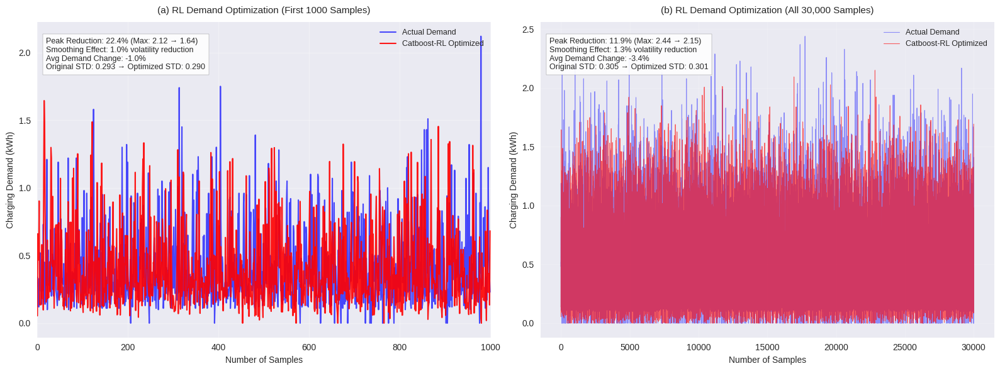


=== RL Optimization Statistics ===
Peak demand reduction: 11.9%
Average Price: 0.374 €/kWh
Price Elasticity: -0.189


In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

plt.figure(figsize=(16, 6))  # Adjusted figure size for 1 row of plots
plt.style.use('seaborn-v0_8')

# ==============================================
# Part 1: CatBoost-RL results
# ==============================================
with open('/content/drive/MyDrive/EVD/data/saved_predictions/catboost_rl_50000_step_30000_data_results.pkl', 'rb') as f:
    rl_results = pickle.load(f)

all_y_test_rl = rl_results['test_results']['y_true']

# Prepare data for all samples optimization plot
n_samples = len(all_y_test_rl)
all_original_demand_rl = []
all_rl_demands = []

k_folds = 10
kf = KFold(n_splits=k_folds, shuffle=True, random_state=42)
X = pd.DataFrame(np.zeros((n_samples, 7)))

for fold, (_, val_idx) in enumerate(kf.split(X)):
    original_demand_fold = all_y_test_rl[val_idx]
    rl_demands_fold = rl_results['rl_results']['demands'][fold]
    min_length = min(len(original_demand_fold), len(rl_demands_fold))
    all_original_demand_rl.extend(original_demand_fold[:min_length])
    all_rl_demands.extend(rl_demands_fold[:min_length])

# ==============================================
# Create the RL plots only (1x2 grid)
# ==============================================
fig, axs = plt.subplots(1, 2, figsize=(16, 6))
plt.subplots_adjust(hspace=0.3, wspace=0.2)

# (a) RL first 1000 samples
axs[0].plot(all_y_test_rl[:1000], 'b-', alpha=0.7, label='Actual Demand', linewidth=1.5)
axs[0].plot(rl_results['rl_results']['demands'][0][:1000], 'r-', alpha=0.9, label='Catboost-RL Optimized', linewidth=1.5)
axs[0].set_xlabel('Number of Samples', fontsize=10)
axs[0].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[0].set_title('(a) RL Demand Optimization (First 1000 Samples)', fontsize=11, pad=10)
axs[0].legend(loc='upper right', fontsize=9, framealpha=1)
axs[0].grid(alpha=0.3)
axs[0].set_xlim(-1, 1001)

# Metrics for (a)
first_1000_actual_rl = all_y_test_rl[:1000]
first_1000_optimized_rl = rl_results['rl_results']['demands'][0][:1000]
peak_reduction_1000_rl = 100 * (1 - np.max(first_1000_optimized_rl)/np.max(first_1000_actual_rl))
original_std_1000_rl = np.std(first_1000_actual_rl)
optimized_std_1000_rl = np.std(first_1000_optimized_rl)
smoothing_1000_rl = 100 * (1 - (optimized_std_1000_rl/original_std_1000_rl))
avg_demand_change_1000_rl = 100 * ((np.mean(first_1000_optimized_rl) - np.mean(first_1000_actual_rl))/np.mean(first_1000_actual_rl))

metric_text_1000_rl = (
    f'Peak Reduction: {peak_reduction_1000_rl:.1f}% (Max: {np.max(first_1000_actual_rl):.2f} → {np.max(first_1000_optimized_rl):.2f})\n'
    f'Smoothing Effect: {smoothing_1000_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_1000_rl:+.1f}%\n'
    f'Original STD: {original_std_1000_rl:.3f} → Optimized STD: {optimized_std_1000_rl:.3f}'
)
axs[0].text(0.02, 0.95, metric_text_1000_rl, transform=axs[0].transAxes,
          bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
          fontsize=9, verticalalignment='top')

# (b) RL all samples
axs[1].plot(all_original_demand_rl, 'b-', alpha=0.4, label='Actual Demand', linewidth=0.8)
axs[1].plot(all_rl_demands, 'r-', alpha=0.6, label='Catboost-RL Optimized', linewidth=0.8)
axs[1].set_xlabel('Number of Samples', fontsize=10)
axs[1].set_ylabel('Charging Demand (kWh)', fontsize=10)
axs[1].set_title('(b) RL Demand Optimization (All 30,000 Samples)', fontsize=11, pad=10)
axs[1].legend(loc='upper right', fontsize=9, framealpha=1)
axs[1].grid(alpha=0.2)

# Metrics for (b)
peak_reduction_rl = 100 * (1 - np.max(all_rl_demands)/np.max(all_original_demand_rl))
original_std_rl = np.std(all_original_demand_rl)
optimized_std_rl = np.std(all_rl_demands)
smoothing_rl = 100 * (1 - (optimized_std_rl/original_std_rl))
avg_demand_change_rl = 100 * ((np.mean(all_rl_demands) - np.mean(all_original_demand_rl))/np.mean(all_original_demand_rl))

metric_text_rl = (
    f'Peak Reduction: {peak_reduction_rl:.1f}% (Max: {np.max(all_original_demand_rl):.2f} → {np.max(all_rl_demands):.2f})\n'
    f'Smoothing Effect: {smoothing_rl:.1f}% volatility reduction\n'
    f'Avg Demand Change: {avg_demand_change_rl:+.1f}%\n'
    f'Original STD: {original_std_rl:.3f} → Optimized STD: {optimized_std_rl:.3f}'
)
axs[1].text(0.02, 0.95, metric_text_rl, transform=axs[1].transAxes,
         bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray'),
         fontsize=9, verticalalignment='top')

# Save and show
plt.tight_layout()
plt.savefig('rl_optimization_results.png', dpi=300, bbox_inches='tight')
plt.show()

# Print optimization statistics
print("\n=== RL Optimization Statistics ===")
print(f"Peak demand reduction: {peak_reduction_rl:.1f}%")
print(f"Average Price: {rl_results['rl_results']['price_stats']['mean']:.3f} €/kWh")
print(f"Price Elasticity: {rl_results['rl_results']['elasticity']:.3f}")